# 🧠 Parkinson's Disease MRI Classification System
### Complete Pipeline: Preprocessing → 7 Models → Grad-CAM → Research Graphs
---


---
## PHASE 1 — Environment Setup & Config


In [1]:
# ============================================================
# 1. Install Required Libraries
# ============================================================
!pip install -q timm
!pip install -q grad-cam==1.4.6
!pip install -q torchmetrics
!pip install -q seaborn
!pip install -q scikit-learn

# ============================================================
# 2. Import Core Libraries
# ============================================================
import os
import random
import warnings
import time
from glob import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.models as models
from torchvision import transforms as T
from torchvision import datasets
from torch.utils.data import Dataset, DataLoader, random_split

from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_curve, auc, roc_auc_score
)
from sklearn.model_selection import train_test_split

import timm
from tqdm import tqdm
import torchmetrics

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

warnings.filterwarnings("ignore")

# ============================================================
# 3. Reproducibility Seeds
# ============================================================
SEED = 2025
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark     = True

# ============================================================
# 4. GPU / Device Configuration
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("=" * 60)
print("DEVICE CONFIGURATION")
print("=" * 60)
print(f"Device Type       : {device}")
if torch.cuda.is_available():
    print(f"GPU Name          : {torch.cuda.get_device_name(0)}")
    print(f"CUDA Version      : {torch.version.cuda}")
    print(f"GPU Memory (GB)   : {round(torch.cuda.get_device_properties(0).total_memory / 1024**3, 2)}")
else:
    print("Running on CPU")

# ============================================================
# 5. Global Configuration — BINARY: NonPD vs PD
# ============================================================
IMG_SIZE    = 176
BATCH_SIZE  = 32
NUM_CLASSES = 2
EPOCHS      = 20

CLASSES = ["NonPD", "PD"]   # sorted() order — matches folder names

MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

print("=" * 60)
print(" PROJECT CONFIGURATION")
print("=" * 60)
print(f"Image Size        : {IMG_SIZE} x {IMG_SIZE}")
print(f"Batch Size        : {BATCH_SIZE}")
print(f"Classes           : {NUM_CLASSES}")
print(f"Class Names       : {CLASSES}")
print(f"Epochs            : {EPOCHS}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 37.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 25.4 MB/s eta 0:00:00
DEVICE CONFIGURATION
Device Type       : cuda
GPU Name          : Tesla T4
CUDA Version      : 12.8
GPU Memory (GB)   : 14.56
 PROJECT CONFIGURATION
Image Size        : 176 x 176
Batch Size        : 32
Classes           : 2
Class Names       : ['NonPD', 'PD']
Epochs            : 20


---
## PHASE 2 — Google Drive Mount & Dataset Paths


In [2]:
# ============================================================
# 1. Mount Google Drive
# ============================================================
from google.colab import drive
drive.mount('/content/drive')

# ============================================================
# 2. Dataset Paths — Parkinson dataset has NO pre-made train/test split,
#    just two class folders directly under Parkinson/
# ============================================================
PROJECT_ROOT = "/content/drive/MyDrive/defence/project dataset"
DATASET_ROOT = os.path.join(PROJECT_ROOT, "Parkinson")

NONPD_DIR = os.path.join(DATASET_ROOT, "NonPD")
PD_DIR    = os.path.join(DATASET_ROOT, "PD")

LOCAL_PROCESSED_DIR = "/content/processed_dataset"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

print("NonPD Dir Exists:", os.path.exists(NONPD_DIR))
print("PD Dir    Exists:", os.path.exists(PD_DIR))
if os.path.exists(NONPD_DIR):
    print("NonPD image count:", len(glob(os.path.join(NONPD_DIR, "*"))))
if os.path.exists(PD_DIR):
    print("PD image count   :", len(glob(os.path.join(PD_DIR, "*"))))

Mounted at /content/drive
NonPD Dir Exists: True
PD Dir    Exists: True
NonPD image count: 1811
PD image count   : 2304


---
## PHASE 3 — Stratified 70/15/15 Split + Brain-Region Cropping + Tensor Caching


In [3]:
# ============================================================
# 1. Build (path, label) list from the two class folders,
#    then create a STRATIFIED 70/15/15 train/val/test split.
#    (No pre-made splits exist for this dataset, unlike the
#    tumor dataset which shipped with train/ and test/ folders.)
# ============================================================
CLASS_NAMES  = sorted(os.listdir(DATASET_ROOT))          # ['NonPD', 'PD']
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}

all_paths, all_labels = [], []
for cls in CLASS_NAMES:
    cls_dir = os.path.join(DATASET_ROOT, cls)
    for p in glob(os.path.join(cls_dir, "*")):
        all_paths.append(p)
        all_labels.append(CLASS_TO_IDX[cls])

print(f"Total images found: {len(all_paths)}")
print(f"Class mapping     : {CLASS_TO_IDX}")

# 70% train, 15% val, 15% test — stratified so class ratio is preserved in each split
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    all_paths, all_labels, test_size=0.30, stratify=all_labels, random_state=SEED
)
val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels, test_size=0.50, stratify=temp_labels, random_state=SEED
)

print(f"Train: {len(train_paths)}  Val: {len(val_paths)}  Test: {len(test_paths)}")


# ============================================================
# 2. Brain-Region Crop (same Otsu + contour approach as the
#    tumor pipeline — removes black margins / scanner artifacts
#    before resize)
# ============================================================
def crop_to_brain(pil_img, pad_frac=0.02, min_area_frac=0.20):
    """Crops out black margins, scanner text, and border artifacts,
    keeping only the brain region. Otsu threshold + largest-contour
    bounding box."""
    gray = np.array(pil_img.convert("L"))
    H, W = gray.shape

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return pil_img

    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)

    if w < min_area_frac * W or h < min_area_frac * H:
        return pil_img

    pad_x, pad_y = int(w * pad_frac), int(h * pad_frac)
    x0, y0 = max(0, x - pad_x), max(0, y - pad_y)
    x1, y1 = min(W, x + w + pad_x), min(H, y + h + pad_y)

    return pil_img.crop((x0, y0, x1, y1))


# ============================================================
# 3. Build uint8 Tensor Cache from an explicit (paths, labels) list
#    (adapted from build_tensor_dataset — that version scanned a
#    root_dir with class subfolders; here we already have the
#    stratified path/label lists from step 1 above)
# ============================================================
import gc
from concurrent.futures import ThreadPoolExecutor

def build_tensor_dataset_from_list(paths, labels, img_size=IMG_SIZE, max_workers=8, desc="split"):
    resize = T.Resize((img_size, img_size))
    n = len(paths)
    tensors    = torch.empty((n, 3, img_size, img_size), dtype=torch.uint8)
    out_labels = torch.empty(n, dtype=torch.long)
    kept_paths = [None] * n
    ok_mask    = torch.zeros(n, dtype=torch.bool)

    def _load_one(i):
        p, lbl = paths[i], labels[i]
        try:
            img = Image.open(p).convert("RGB")
            img = crop_to_brain(img)
            img = resize(img)
            arr = torch.from_numpy(np.array(img)).permute(2, 0, 1).contiguous()
            return i, arr, lbl, p
        except Exception as e:
            print(f"  Skipped {p}: {e}")
            return i, None, None, None

    with ThreadPoolExecutor(max_workers=max_workers) as ex:
        for i, arr, lbl, p in tqdm(ex.map(_load_one, range(n)), total=n, desc=f"  {desc}"):
            if arr is not None:
                tensors[i]    = arr
                out_labels[i] = lbl
                kept_paths[i] = p
                ok_mask[i]    = True

    if not ok_mask.all():
        tensors    = tensors[ok_mask]
        out_labels = out_labels[ok_mask]
        kept_paths = [p for p, ok in zip(kept_paths, ok_mask.tolist()) if ok]

    return {
        "tensors"     : tensors,
        "labels"      : out_labels,
        "paths"       : kept_paths,
        "class_names" : CLASS_NAMES,
        "class_to_idx": CLASS_TO_IDX,
    }


TRAIN_PT_PATH = os.path.join(LOCAL_PROCESSED_DIR, "train_tensors.pt")
VAL_PT_PATH   = os.path.join(LOCAL_PROCESSED_DIR, "val_tensors.pt")
TEST_PT_PATH  = os.path.join(LOCAL_PROCESSED_DIR, "test_tensors.pt")

if not (os.path.exists(TRAIN_PT_PATH) and os.path.exists(VAL_PT_PATH) and os.path.exists(TEST_PT_PATH)):
    print("Building TRAIN tensor dataset (brain-cropped, parallelized, uint8) ...")
    train_tensor_data = build_tensor_dataset_from_list(train_paths, train_labels, desc="train")
    torch.save(train_tensor_data, TRAIN_PT_PATH)
    del train_tensor_data; gc.collect()

    print("Building VAL tensor dataset ...")
    val_tensor_data = build_tensor_dataset_from_list(val_paths, val_labels, desc="val")
    torch.save(val_tensor_data, VAL_PT_PATH)
    del val_tensor_data; gc.collect()

    print("Building TEST tensor dataset ...")
    test_tensor_data = build_tensor_dataset_from_list(test_paths, test_labels, desc="test")
    torch.save(test_tensor_data, TEST_PT_PATH)
    del test_tensor_data; gc.collect()
else:
    print(".pt files already exist — skipping build. Phase 4 will load them.")

print("\nPHASE 3 DONE")

Total images found: 4120
Class mapping     : {'NonPD': 0, 'PD': 1, 'saved_models': 2}
Train: 2884  Val: 618  Test: 618
Building TRAIN tensor dataset (brain-cropped, parallelized, uint8) ...


  train:  39%|███▉      | 1127/2884 [01:15<00:36, 48.01it/s]

  Skipped /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results: [Errno 21] Is a directory: '/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results'


  train:  60%|█████▉    | 1716/2884 [01:35<01:04, 18.03it/s]

  Skipped /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/InceptionV3_best.pth: cannot identify image file '/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/InceptionV3_best.pth'


  train:  79%|███████▊  | 2270/2884 [01:51<00:18, 32.87it/s]

  Skipped /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/DenseNet121_best.pth: cannot identify image file '/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/DenseNet121_best.pth'


  train: 100%|██████████| 2884/2884 [02:11<00:00, 21.85it/s]


Building VAL tensor dataset ...


  val:  17%|█▋        | 106/618 [00:03<00:12, 40.55it/s]

  Skipped /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/VGG16_best.pth: cannot identify image file '/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/VGG16_best.pth'


  val: 100%|██████████| 618/618 [00:20<00:00, 30.74it/s]


Building TEST tensor dataset ...


  test:  36%|███▌      | 220/618 [00:06<00:08, 44.29it/s]

  Skipped /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/VGG19_best.pth: [Errno 2] No such file or directory: '/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/VGG19_best.pth'


  test: 100%|██████████| 618/618 [00:16<00:00, 37.08it/s]



PHASE 3 DONE


---
## PHASE 4 — Load Processed Datasets, Split-Aware Loader, DataLoaders + Augmentation


In [4]:
# ============================================================
# 1. Smart Load (train/val/test are now separate .pt files,
#    since we built our own stratified split in Phase 3 —
#    no random_split needed here, unlike the tumor template
#    which only split train/ into train/val)
# ============================================================
if os.path.exists(TRAIN_PT_PATH) and os.path.exists(VAL_PT_PATH) and os.path.exists(TEST_PT_PATH):
    print("[FAST PATH] .pt files found — loading tensors directly ...")
    train_raw = torch.load(TRAIN_PT_PATH, weights_only=False)
    val_raw   = torch.load(VAL_PT_PATH,   weights_only=False)
    test_raw  = torch.load(TEST_PT_PATH,  weights_only=False)
else:
    raise FileNotFoundError("Run Phase 3 first to build the tensor caches.")

print(f"Train tensors shape : {train_raw['tensors'].shape}")
print(f"Val   tensors shape : {val_raw['tensors'].shape}")
print(f"Test  tensors shape : {test_raw['tensors'].shape}")


# ============================================================
# 2. In-Memory Tensor Dataset Class (identical to template)
# ============================================================
class TensorDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict, transform=None):
        self.tensors      = data_dict["tensors"]
        self.labels       = data_dict["labels"]
        self.paths        = data_dict["paths"]
        self.class_names  = data_dict["class_names"]
        self.class_to_idx = data_dict["class_to_idx"]
        self.transform    = transform
        self.mean = torch.tensor(MEAN).view(3, 1, 1)
        self.std  = torch.tensor(STD).view(3, 1, 1)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img   = self.tensors[idx].float() / 255.0
        img   = (img - self.mean) / self.std
        label = self.labels[idx].item()
        path  = self.paths[idx]
        if self.transform:
            img = self.transform(img)
        return img, label, path


train_dataset = TensorDataset(train_raw)
val_dataset   = TensorDataset(val_raw)
test_dataset  = TensorDataset(test_raw)

CLASS_NAMES  = train_dataset.class_names
CLASS_TO_IDX = train_dataset.class_to_idx
NUM_CLASSES  = len(CLASS_NAMES)

print(f"\nTrain samples : {len(train_dataset)}")
print(f"Val samples   : {len(val_dataset)}")
print(f"Test samples  : {len(test_dataset)}")
print(f"Classes       : {CLASS_NAMES}")

def count_classes(dataset):
    counts = {c: 0 for c in dataset.class_names}
    for label in dataset.labels:
        counts[dataset.class_names[label]] += 1
    return counts

for name, ds in [("TRAIN", train_dataset), ("VAL", val_dataset), ("TEST", test_dataset)]:
    print(f"\n{name} DISTRIBUTION:")
    for cls, cnt in count_classes(ds).items():
        print(f"  {cls:<10} : {cnt}")

# NOTE: train_data / val_data below replace the tumor template's
# random_split step — our split already happened in Phase 3.
train_data = train_dataset
val_data   = val_dataset


# ============================================================
# 3. DataLoaders + Per-Sample Augmentation (identical logic to template)
# ============================================================
BATCH_SIZE = 64

import torchvision.transforms.functional as TF

FILL_VALUE = [(-m / s) for m, s in zip(MEAN, STD)]

def batch_augment(batch):
    imgs, labels, paths = zip(*batch)
    imgs   = torch.stack(imgs)
    labels = torch.tensor(labels, dtype=torch.long)

    B, C, H, W = imgs.shape
    out = torch.empty_like(imgs)

    for i in range(B):
        img = imgs[i]
        if torch.rand(1).item() > 0.5:
            img = TF.hflip(img)

        angle = (torch.rand(1).item() * 30) - 15
        tx    = (torch.rand(1).item() * 0.10 - 0.05) * W
        ty    = (torch.rand(1).item() * 0.10 - 0.05) * H
        scale = 1.0 + (torch.rand(1).item() * 0.20 - 0.10)

        img = TF.affine(img, angle=angle, translate=[int(tx), int(ty)],
                         scale=scale, shear=[0.0, 0.0], fill=FILL_VALUE)
        out[i] = img

    return out, labels, list(paths)

def standard_collate(batch):
    imgs, labels, paths = zip(*batch)
    return torch.stack(imgs), torch.tensor(labels, dtype=torch.long), list(paths)

train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True,
                           num_workers=0, pin_memory=False, collate_fn=batch_augment, drop_last=True)
val_loader   = DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=0, pin_memory=False, collate_fn=standard_collate)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=0, pin_memory=False, collate_fn=standard_collate)

print(f"Batch size         : {BATCH_SIZE}")
print(f"Train batches      : {len(train_loader)}")
print(f"Validation batches : {len(val_loader)}")
print(f"Test batches       : {len(test_loader)}")

imgs, lbls, _ = next(iter(train_loader))
print(f"First batch shape  : {imgs.shape}")
print("PHASE 4 COMPLETED — DataLoaders ready")

[FAST PATH] .pt files found — loading tensors directly ...
Train tensors shape : torch.Size([2881, 3, 176, 176])
Val   tensors shape : torch.Size([617, 3, 176, 176])
Test  tensors shape : torch.Size([617, 3, 176, 176])

Train samples : 2881
Val samples   : 617
Test samples  : 617
Classes       : ['NonPD', 'PD', 'saved_models']

TRAIN DISTRIBUTION:
  NonPD      : 1268
  PD         : 1613
  saved_models : 0

VAL DISTRIBUTION:
  NonPD      : 271
  PD         : 346
  saved_models : 0

TEST DISTRIBUTION:
  NonPD      : 272
  PD         : 345
  saved_models : 0
Batch size         : 64
Train batches      : 45
Validation batches : 10
Test batches       : 10
First batch shape  : torch.Size([64, 3, 176, 176])
PHASE 4 COMPLETED — DataLoaders ready


---
## PHASE 5 — Data Visualization

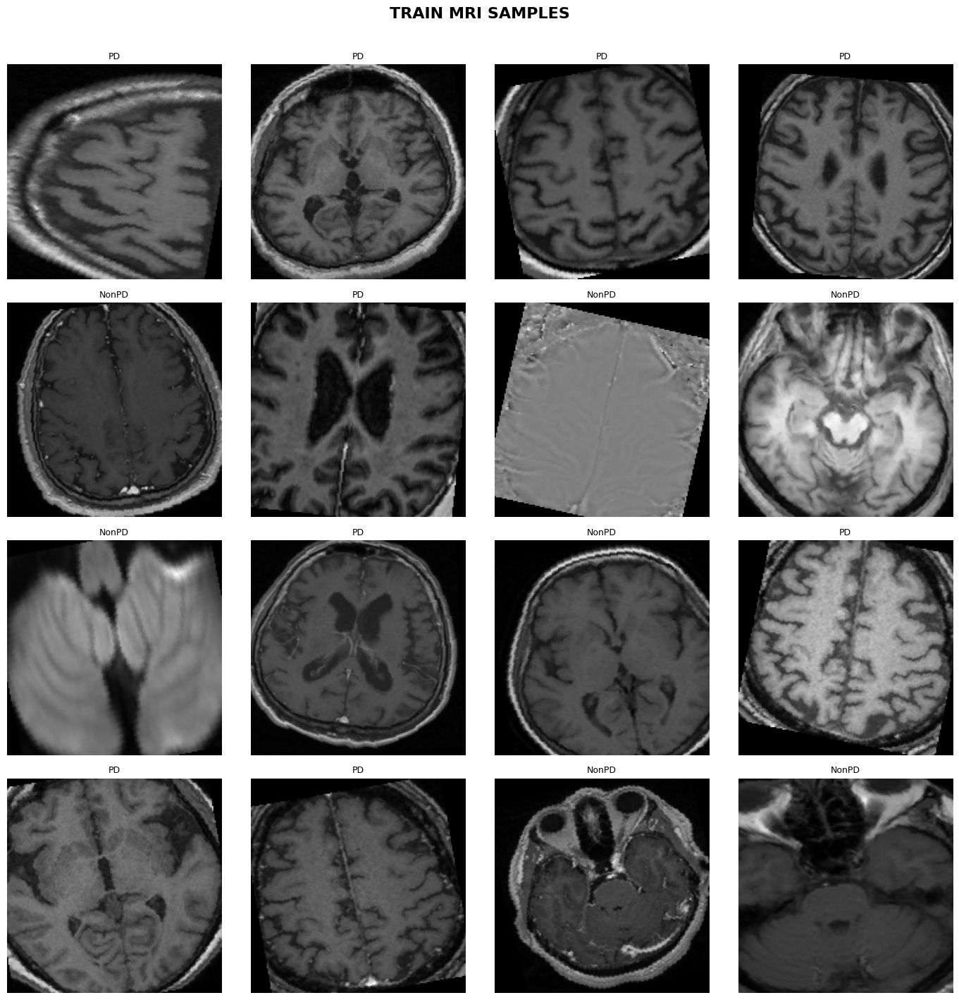

In [5]:
# ============================================================
# Denormalization Helper
# ============================================================
def denormalize(tensor, mean=MEAN, std=STD):
    img = tensor.clone().detach().cpu().numpy()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    img = np.transpose(img, (1, 2, 0))
    return np.clip(img, 0, 1)

def visualize_samples(loader, class_names, title, rows=4, cols=4):
    images, labels, _ = next(iter(loader))
    plt.figure(figsize=(14, 14))
    plt.suptitle(title, fontsize=16, fontweight='bold', y=1.01)
    n = min(rows * cols, len(images))
    for i in range(n):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(denormalize(images[i]), cmap="gray")
        plt.title(class_names[labels[i]], fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

visualize_samples(train_loader, CLASS_NAMES, "TRAIN MRI SAMPLES")

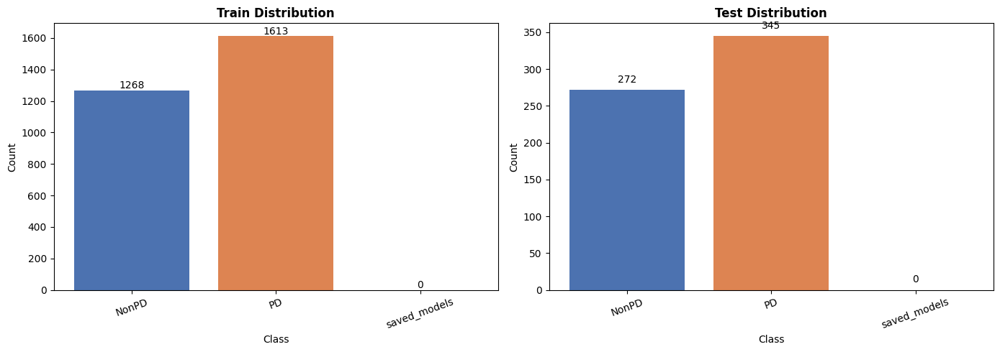

PHASE 5 COMPLETED


In [6]:
# ============================================================
# Dataset Distribution Bar Chart
# ============================================================
def get_distribution(dataset):
    counts = {c: 0 for c in dataset.class_names}
    for lbl in dataset.labels:
        counts[dataset.class_names[lbl]] += 1
    return counts

train_counts = get_distribution(train_dataset)
test_counts  = get_distribution(test_dataset)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, counts, title in zip(axes,
                              [train_counts, test_counts],
                              ["Train Distribution", "Test Distribution"]):
    bars = ax.bar(counts.keys(), counts.values(), color=['#4C72B0','#DD8452','#55A868','#C44E52'])
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel("Class")
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', rotation=20)
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
                str(int(bar.get_height())), ha='center', fontsize=10)

plt.tight_layout()
plt.show()
print("PHASE 5 COMPLETED")

---
## PHASE 6 — Shared Training & Evaluation Engine
> These functions are used by all 7 models. Run once.

In [7]:
# ============================================================
# FIXED: Shared Training Engine
# Changes: (FIXED in this change request)
#   1. torch.amp instead of torch.cuda.amp (deprecation fix)
#   2. Handles InceptionV3 aux_logits tuple output during train mode
#   3. Correctly handles ReduceLROnPlateau scheduler.step(val_loss)
# ============================================================
import sys, shutil, os as _os
import torch.amp
import threading

def train_model(model, model_name, train_loader, val_loader,
                criterion, optimizer, scheduler=None, epochs=EPOCHS):

    local_path = f"/content/{model_name}_best.pth"
    drive_dir  = "/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models"
    _os.makedirs(drive_dir, exist_ok=True)
    drive_path = f"{drive_dir}/{model_name}_best.pth"

    # Fixed: use torch.amp instead of deprecated torch.cuda.amp
    scaler = torch.amp.GradScaler('cuda')

    best_val_acc = 0.0
    train_losses, val_losses         = [], []
    train_accuracies, val_accuracies = [], []

    print(f"\n{'='*60}")
    print(f" TRAINING: {model_name}")
    print(f"{'='*60}")
    sys.stdout.flush()

    start_time = time.time()

    for epoch in range(epochs):
        # ── TRAIN ────────────────────────────────────────────
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            # Fixed: use torch.amp.autocast instead of deprecated version
            with torch.amp.autocast('cuda'):
                outputs = model(images)

                # FIX: InceptionV3 returns a named tuple (logits, aux_logits)
                # during training when aux_logits=True
                if isinstance(outputs, tuple):
                    logits, aux_logits_out = outputs[0], outputs[1]
                    loss = criterion(logits, labels)
                    if aux_logits_out is not None:
                        loss += 0.4 * criterion(aux_logits_out, labels)
                    outputs = logits  # use main logits for accuracy
                else:
                    loss = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()

            running_loss += loss.item()
            _, predicted  = torch.max(outputs, 1)
            total        += labels.size(0)
            correct      += (predicted == labels).sum().item()

            if (batch_idx + 1) % 20 == 0:
                print(f"  Epoch {epoch+1}/{epochs} | Batch {batch_idx+1}/{len(train_loader)} | "
                      f"Loss: {running_loss/(batch_idx+1):.4f}", end='\r')
                sys.stdout.flush()

        train_loss = running_loss / len(train_loader)
        train_acc  = 100 * correct / total
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        # ── VALIDATE ─────────────────────────────────────────
        model.eval()
        val_loss_sum, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for images, labels, _ in val_loader:
                images = images.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                with torch.amp.autocast('cuda'):
                    outputs = model(images)
                    # In eval mode InceptionV3 returns plain tensor, but be safe
                    if isinstance(outputs, tuple):
                        outputs = outputs[0]
                    loss = criterion(outputs, labels)
                val_loss_sum += loss.item()
                _, predicted  = torch.max(outputs, 1)
                total        += labels.size(0)
                correct      += (predicted == labels).sum().item()

        val_loss = val_loss_sum / len(val_loader)
        val_acc  = 100 * correct / total
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        # FIX: Correctly call scheduler.step() for ReduceLROnPlateau
        if scheduler:
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(val_loss) # Pass validation loss for ReduceLROnPlateau
            else:
                scheduler.step()         # For other schedulers like CosineAnnealingLR

        # ── SAVE BEST → local + Drive (non-blocking) ─────────
        saved = ""
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), local_path)
            def _copy():
                try:
                    shutil.copy2(local_path, drive_path)
                except:
                    pass
            threading.Thread(target=_copy, daemon=True).start()
            saved = "  <- Best Saved (local + Drive)"

        print(f"Epoch [{epoch+1:02d}/{epochs}]  "
              f"Train Loss: {train_loss:.4f}  Train Acc: {train_acc:.2f}%  "
              f"Val Loss: {val_loss:.4f}  Val Acc: {val_acc:.2f}%{saved}")
        sys.stdout.flush()

    elapsed = time.time() - start_time
    print(f"\nTraining Time : {elapsed/60:.1f} min")
    print(f"Best Val Acc  : {best_val_acc:.2f}%")
    print(f"Saved locally : {local_path}")
    print(f"Saved to Drive: {drive_path}")
    sys.stdout.flush()

    return {
        "train_losses"    : train_losses,
        "val_losses"      : val_losses,
        "train_accuracies": train_accuracies,
        "val_accuracies"  : val_accuracies,
        "best_val_acc"    : best_val_acc,
        "save_path"       : local_path,
        "drive_path"      : drive_path,
        "training_time"   : elapsed
    }

In [8]:
# ============================================================
# Evaluation Function (Test Set)
# ============================================================
def evaluate_model(model, test_loader, class_names, model_name):

    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs   = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    all_preds  = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs  = np.array(all_probs)

    accuracy = 100 * np.sum(all_preds == all_labels) / len(all_labels)

    print(f"\n{'='*60}")
    print(f" TEST EVALUATION: {model_name}")
    print(f"{'='*60}")
    print(f"\nTest Accuracy : {accuracy:.2f}%")
    print("\nClassification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    return {
        "accuracy"  : accuracy,
        "preds"     : all_preds,
        "labels"    : all_labels,
        "probs"     : all_probs
    }

In [9]:
# ============================================================
# Cross-Session Result Storage (Google Drive)
# Saves only the small numbers PHASE 14 needs, so the comparison
# dashboard can be rebuilt in ANY future runtime/session without
# needing to retrain or re-hold every model in memory at once.
# ============================================================
import json

RESULTS_DIR = "/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results"
os.makedirs(RESULTS_DIR, exist_ok=True)

def save_model_result(model_name, eval_dict, history_dict, mean_auc):
    """Call this once, right after evaluating a model (any session).
    Writes a tiny JSON to Drive so PHASE 14 can pick it up later,
    even in a completely different Colab runtime/day."""
    result = {
        "Model": model_name,
        "Test Accuracy (%)": float(eval_dict["accuracy"]),
        "Mean AUC": float(mean_auc),
        "Training Time (min)": float(history_dict["training_time"]) / 60,
        "Best Val Acc (%)": float(history_dict["best_val_acc"]),
    }
    path = f"{RESULTS_DIR}/{model_name.replace(' ', '_').replace('-', '_')}_result.json"
    with open(path, "w") as f:
        json.dump(result, f, indent=2)
    print(f"Saved -> {path}")

def load_all_model_results():
    """Reads every *_result.json in Drive and returns a DataFrame.
    Works from a totally fresh runtime — only needs Drive mounted."""
    rows = []
    for fname in sorted(os.listdir(RESULTS_DIR)):
        if fname.endswith("_result.json"):
            with open(os.path.join(RESULTS_DIR, fname)) as f:
                rows.append(json.load(f))
    if not rows:
        raise FileNotFoundError(
            f"No result files found in {RESULTS_DIR}. "
            "Evaluate at least one model first (this calls save_model_result())."
        )
    return pd.DataFrame(rows)


In [10]:
# ============================================================
# Plot Training Curves
# ============================================================
def plot_training_curves(history, model_name):

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{model_name} — Training Curves", fontsize=14, fontweight='bold')

    axes[0].plot(history["train_losses"],     label="Train Loss",     color='#4C72B0')
    axes[0].plot(history["val_losses"],       label="Val Loss",       color='#DD8452')
    axes[0].set_title("Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history["train_accuracies"], label="Train Accuracy", color='#55A868')
    axes[1].plot(history["val_accuracies"],   label="Val Accuracy",   color='#C44E52')
    axes[1].set_title("Accuracy (%)")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy (%)")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

In [11]:
# ============================================================
# Plot Confusion Matrix
# ============================================================
def plot_confusion_matrix(eval_results, class_names, model_name):

    cm = confusion_matrix(eval_results["labels"], eval_results["preds"])

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"{model_name} — Confusion Matrix", fontweight='bold')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

In [12]:
# ============================================================
# Plot ROC Curves (One-vs-Rest per class)
# ============================================================
def plot_roc_curves(eval_results, class_names, model_name):

    labels     = eval_results["labels"]
    probs      = eval_results["probs"]
    n_classes  = len(class_names)

    plt.figure(figsize=(9, 7))

    auc_scores = []
    for i, cls in enumerate(class_names):
        binary_labels = (labels == i).astype(int)
        fpr, tpr, _   = roc_curve(binary_labels, probs[:, i])
        roc_auc       = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        plt.plot(fpr, tpr, label=f"{cls}  (AUC = {roc_auc:.4f})")

    plt.plot([0,1],[0,1],'k--', lw=1)
    plt.title(f"{model_name} — ROC Curves (One-vs-Rest)", fontweight='bold')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    mean_auc = np.mean(auc_scores)
    print(f"Mean AUC: {mean_auc:.4f}")
    return mean_auc, auc_scores

In [13]:
# ============================================================
# Confidence Distribution Plot
# ============================================================
def plot_confidence_distribution(eval_results, class_names, model_name):

    probs  = eval_results["probs"]
    preds  = eval_results["preds"]
    labels = eval_results["labels"]

    max_conf = np.max(probs, axis=1)
    correct  = (preds == labels)

    plt.figure(figsize=(9, 5))
    plt.hist(max_conf[correct],  bins=30, alpha=0.7, label="Correct",   color='#55A868')
    plt.hist(max_conf[~correct], bins=30, alpha=0.7, label="Incorrect", color='#C44E52')
    plt.title(f"{model_name} — Confidence Distribution", fontweight='bold')
    plt.xlabel("Max Confidence Score")
    plt.ylabel("Count")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [14]:
# ============================================================
# Error Analysis — Show Misclassified Samples
# ============================================================
def plot_error_analysis(model, test_loader, class_names, model_name, n_samples=8):

    model.eval()
    wrong_images, wrong_preds, wrong_labels = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images_gpu, labels_gpu = images.to(device), labels.to(device)
            outputs  = model(images_gpu)
            _, preds = torch.max(outputs, 1)

            mask = (preds != labels_gpu)
            for i in range(len(mask)):
                if mask[i]:
                    wrong_images.append(images[i])
                    wrong_preds.append(preds[i].item())
                    wrong_labels.append(labels[i].item())

                if len(wrong_images) >= n_samples:
                    break
            if len(wrong_images) >= n_samples:
                break

    if not wrong_images:
        print("No misclassified samples found!")
        return

    cols = 4
    rows = (len(wrong_images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 3.5))
    fig.suptitle(f"{model_name} — Misclassified Samples", fontsize=13, fontweight='bold')
    axes = axes.flatten() if rows > 1 else [axes] if cols == 1 else axes

    for i in range(len(wrong_images)):
        img = denormalize(wrong_images[i])
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(
            f"True: {class_names[wrong_labels[i]]}\nPred: {class_names[wrong_preds[i]]}",
            fontsize=8, color='red'
        )
        axes[i].axis("off")

    for j in range(len(wrong_images), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
    print(f"Total misclassified shown: {len(wrong_images)}")

In [15]:
# ============================================================
# Grad-CAM Visualization Function
# ============================================================
def run_gradcam(model, model_name, target_layer, test_loader,
                class_names, n_samples=8, reshape_transform=None):
    """
    Generates Grad-CAM heatmaps overlaid on MRI images.

    Parameters
    ----------
    model        : trained PyTorch model
    model_name   : string label for titles
    target_layer : the conv layer to hook  (e.g. model.features[-1])
    test_loader  : DataLoader
    class_names  : list of class name strings
    n_samples    : number of images to visualize
    """

    # Store original requires_grad states for ALL model parameters
    original_requires_grad_states = {}
    for name, param in model.named_parameters():
        original_requires_grad_states[name] = param.requires_grad
        param.requires_grad = True # Temporarily enable gradients for all

    model.eval()

    if reshape_transform is not None:
        # Needed for transformer backbones (ViT / Swin): reshapes the
        # (batch, tokens, channels) sequence back into a spatial
        # (batch, channels, H, W) map that Grad-CAM can operate on.
        cam = GradCAM(model=model, target_layers=[target_layer],
                      reshape_transform=reshape_transform)
    else:
        cam = GradCAM(model=model, target_layers=[target_layer])

    sample_images, sample_labels, _ = [], [], []
    collected = 0

    for images, labels, _ in test_loader:
        for i in range(len(images)):
            sample_images.append(images[i])
            sample_labels.append(labels[i].item())
            collected += 1
            if collected >= n_samples:
                break
        if collected >= n_samples:
            break

    cols = 4
    rows = (n_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols * 2, figsize=(cols * 5, rows * 4))
    fig.suptitle(f"{model_name} — Grad-CAM Heatmaps", fontsize=14, fontweight='bold')

    for i in range(n_samples):
        img_tensor = sample_images[i].unsqueeze(0).to(device)
        true_label = sample_labels[i]

        # Forward pass to get prediction
        with torch.no_grad():
            output = model(img_tensor)
            pred_label = torch.argmax(output, dim=1).item()

        # Grad-CAM for predicted class
        targets   = [ClassifierOutputTarget(pred_label)]
        grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]

        # Denormalize for overlay
        rgb_img = np.ascontiguousarray(denormalize(sample_images[i]).astype(np.float32))
        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        row  = i // cols
        col  = (i % cols) * 2

        # Original MRI
        axes[row, col].imshow(rgb_img, cmap='gray')
        axes[row, col].set_title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
            fontsize=8,
            color='green' if true_label == pred_label else 'red'
        )
        axes[row, col].axis('off')

        # Grad-CAM Overlay
        axes[row, col + 1].imshow(cam_image)
        axes[row, col + 1].set_title("Grad-CAM", fontsize=8)
        axes[row, col + 1].axis('off')

    # Hide unused axes
    total_axes = rows * cols * 2
    for j in range(n_samples * 2, total_axes):
        r, c = divmod(j, cols * 2)
        axes[r, c].axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Grad-CAM complete for {model_name}")

    # Restore original requires_grad states
    for name, param in model.named_parameters():
        param.requires_grad = original_requires_grad_states[name]


---
## PHASE 7 — Model 1: VGG16

In [16]:
# ============================================================
# VGG16 — Build Model
# ============================================================
MODEL_NAME = "VGG16"

vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

# Freeze early layers, unfreeze last 2 conv blocks (features[24:])
for param in vgg16.features.parameters():
    param.requires_grad = False
for param in vgg16.features[24:].parameters():
    param.requires_grad = True

# Improved classifier head
vgg16.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg16 = vgg16.to(device)
trainable = sum(p.numel() for p in vgg16.parameters() if p.requires_grad)
print(f"VGG16 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:06<00:00, 85.2MB/s]


VGG16 trainable params: 128,723,970


In [17]:
# Quick sanity check — run this before training
import sys
criterion = nn.CrossEntropyLoss() # Define criterion locally for this check
vgg16.train()
images, labels, _ = next(iter(train_loader))
images, labels = images.to(device), labels.to(device)
outputs = vgg16(images)
loss = criterion(outputs, labels)
loss.backward()
print("Forward + backward pass: OK")
print(f"Output shape: {outputs.shape}")
sys.stdout.flush()

Forward + backward pass: OK
Output shape: torch.Size([64, 2])


In [18]:
import torch.optim as optim

# ============================================================
# VGG16 — Train
# ============================================================
criterion_vgg16  = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg16  = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg16.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg16  = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg16, T_max=EPOCHS, eta_min=1e-6
)

history_vgg16 = train_model(
    model=vgg16, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg16, optimizer=optimizer_vgg16,
    scheduler=scheduler_vgg16, epochs=EPOCHS
)



 TRAINING: VGG16
Epoch [01/20]  Train Loss: 0.5701  Train Acc: 73.92%  Val Loss: 0.4778  Val Acc: 82.17%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.4467  Train Acc: 84.17%  Val Loss: 0.3837  Val Acc: 88.49%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3764  Train Acc: 89.55%  Val Loss: 0.4415  Val Acc: 84.76%
Epoch [04/20]  Train Loss: 0.3342  Train Acc: 92.64%  Val Loss: 0.3330  Val Acc: 91.57%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3009  Train Acc: 95.14%  Val Loss: 0.5087  Val Acc: 82.82%
Epoch [06/20]  Train Loss: 0.2919  Train Acc: 95.24%  Val Loss: 0.3072  Val Acc: 94.17%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.2801  Train Acc: 95.83%  Val Loss: 0.5143  Val Acc: 82.98%
Epoch [08/20]  Train Loss: 0.2601  Train Acc: 97.01%  Val Loss: 0.2619  Val Acc: 95.79%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.2494  Train Acc: 97.60%  Val Loss: 0.2789  Val Acc: 96.27%  <- Best Saved (local + Drive)
Epoc


 TEST EVALUATION: VGG16

Test Accuracy : 96.76%

Classification Report:

              precision    recall  f1-score   support

       NonPD       0.97      0.96      0.96       272
          PD       0.97      0.97      0.97       346

    accuracy                           0.97       618
   macro avg       0.97      0.97      0.97       618
weighted avg       0.97      0.97      0.97       618



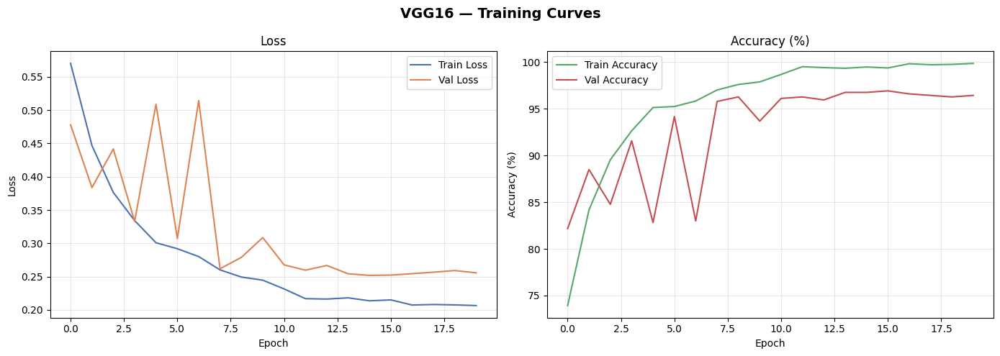

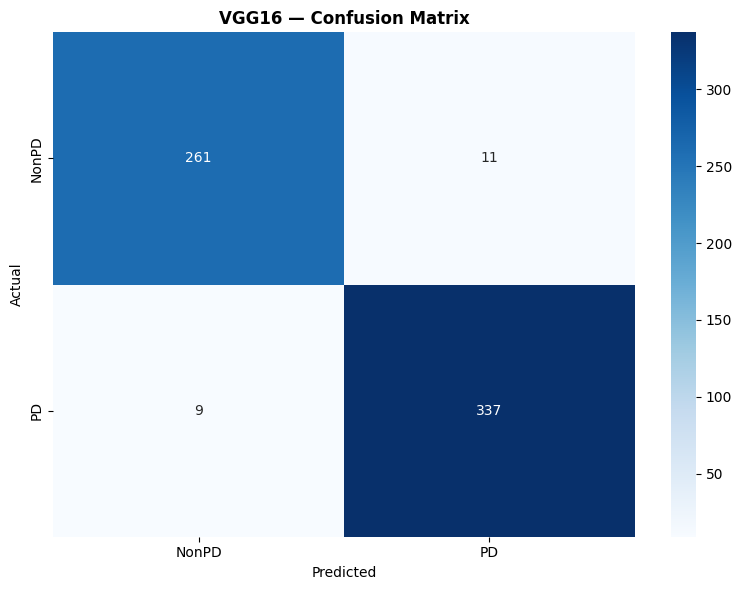

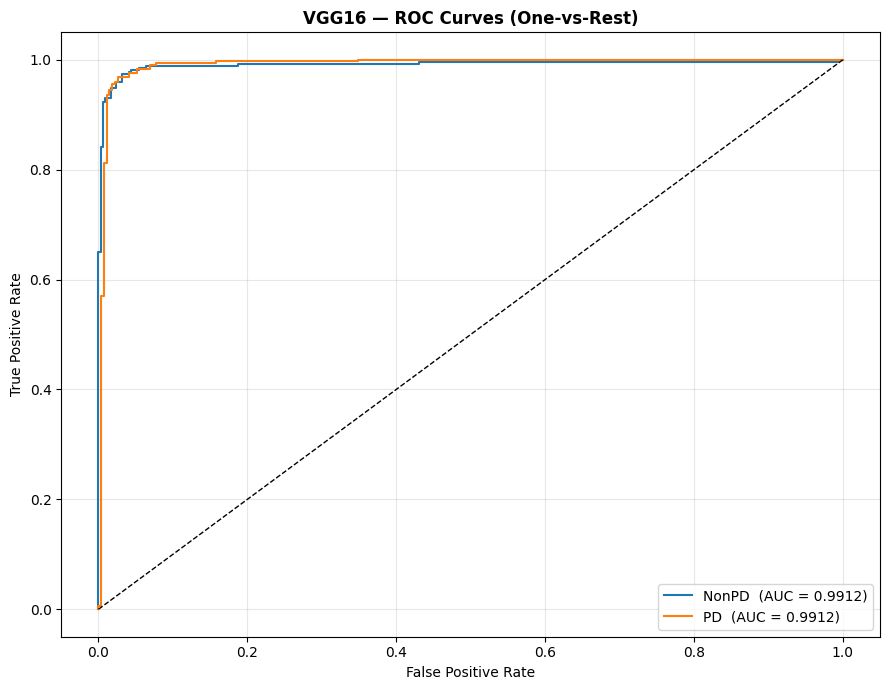

Mean AUC: 0.9912


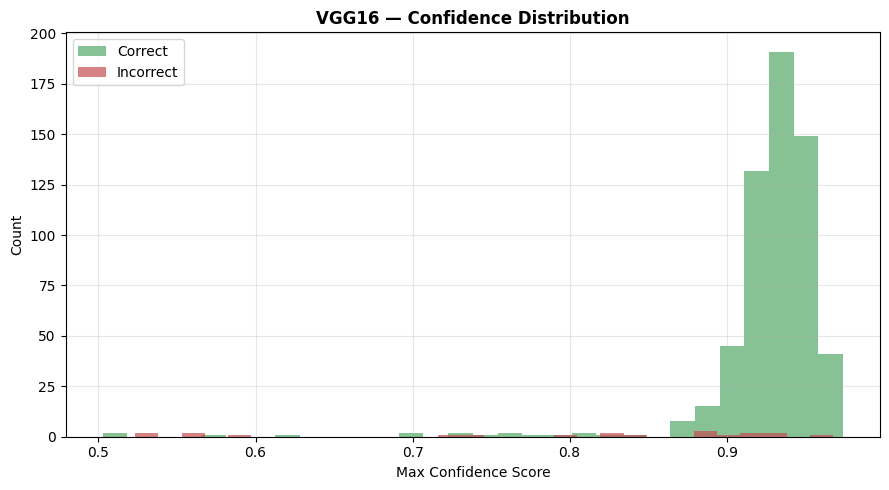

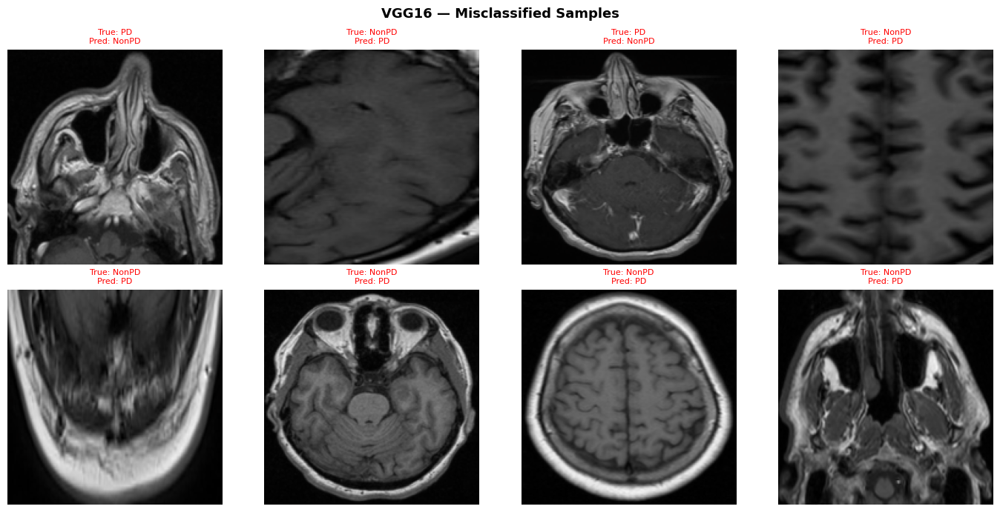

Total misclassified shown: 8


In [19]:
# ============================================================
# VGG16 — Load Best & Evaluate
# ============================================================
vgg16.load_state_dict(torch.load(history_vgg16["save_path"], map_location=device))

eval_vgg16 = evaluate_model(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg16, MODEL_NAME)
plot_confusion_matrix(eval_vgg16, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg16, auc_scores_vgg16 = plot_roc_curves(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)

In [20]:
save_model_result("VGG16", eval_vgg16, history_vgg16, mean_auc_vgg16)


Saved -> /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results/VGG16_result.json


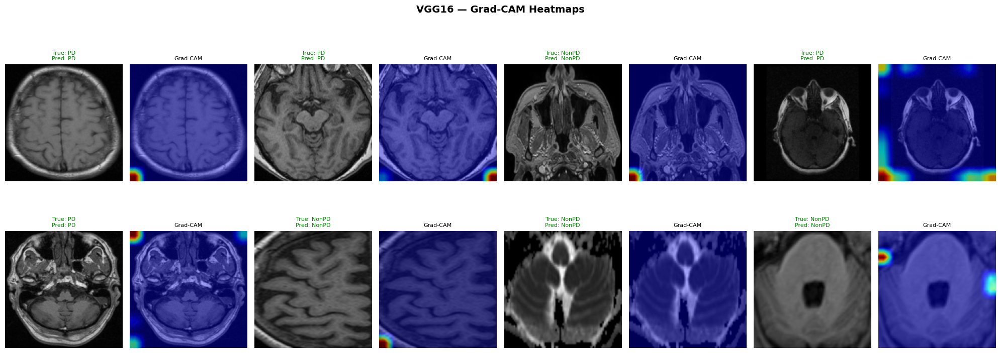

Grad-CAM complete for VGG16


In [21]:
# ============================================================
# VGG16 — Grad-CAM
# ============================================================
# Target layer: last conv block in VGG16 features
run_gradcam(
    model=vgg16,
    model_name=MODEL_NAME,
    target_layer=vgg16.features[-3],  # Conv2d layer before MaxPool
    test_loader=test_loader,
    class_names=CLASS_NAMES,
    n_samples=8
)

---
## PHASE 8 — Model 2: VGG19

In [16]:
# ============================================================
# VGG19 — Build Model
# ============================================================
MODEL_NAME = "VGG19"

vgg19 = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)

for param in vgg19.features.parameters():
    param.requires_grad = False
for param in vgg19.features[28:].parameters():   # unfreeze last 2 blocks
    param.requires_grad = True

vgg19.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg19 = vgg19.to(device)
trainable = sum(p.numel() for p in vgg19.parameters() if p.requires_grad)
print(f"VGG19 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [01:23<00:00, 6.85MB/s]


VGG19 trainable params: 131,084,291


In [17]:
# ============================================================
# VGG19 — Train
# ============================================================
criterion_vgg19  = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg19  = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg19.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg19  = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg19, T_max=EPOCHS, eta_min=1e-6
)

history_vgg19 = train_model(
    model=vgg19, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg19, optimizer=optimizer_vgg19,
    scheduler=scheduler_vgg19, epochs=EPOCHS
)



 TRAINING: VGG19
Epoch [01/20]  Train Loss: 0.7582  Train Acc: 67.47%  Val Loss: 0.6308  Val Acc: 78.77%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.5619  Train Acc: 84.86%  Val Loss: 0.5358  Val Acc: 85.90%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.5067  Train Acc: 88.89%  Val Loss: 0.5657  Val Acc: 86.22%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.4504  Train Acc: 91.77%  Val Loss: 0.5465  Val Acc: 85.90%
Epoch [05/20]  Train Loss: 0.4170  Train Acc: 93.72%  Val Loss: 0.4225  Val Acc: 92.54%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.4074  Train Acc: 94.69%  Val Loss: 0.3931  Val Acc: 94.98%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.4008  Train Acc: 95.21%  Val Loss: 0.4637  Val Acc: 90.44%
Epoch [08/20]  Train Loss: 0.3749  Train Acc: 96.04%  Val Loss: 0.4843  Val Acc: 89.47%
Epoch [09/20]  Train Loss: 0.3677  Train Acc: 96.56%  Val Loss: 0.3763  Val Acc: 95.79%  <- Best Saved (local + Drive)
Epoc


 TEST EVALUATION: VGG19

Test Accuracy : 95.46%

Classification Report:

              precision    recall  f1-score   support

       NonPD       0.93      0.97      0.95       272
          PD       0.97      0.94      0.96       345

    accuracy                           0.95       617
   macro avg       0.95      0.96      0.95       617
weighted avg       0.96      0.95      0.95       617



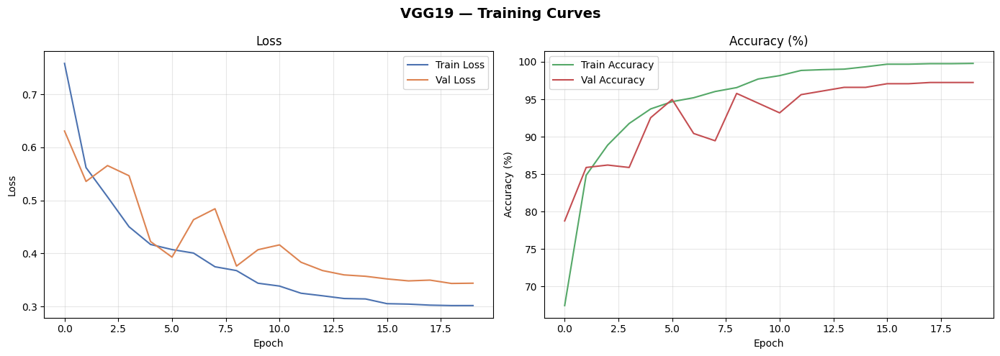

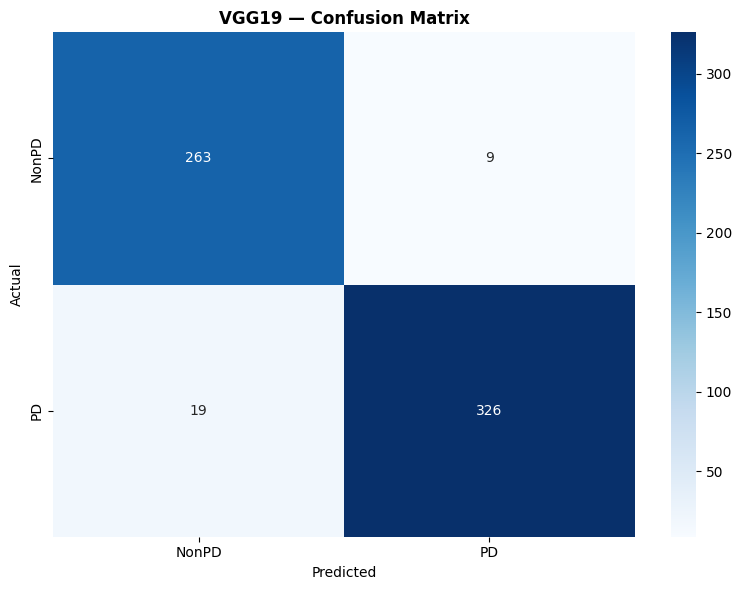

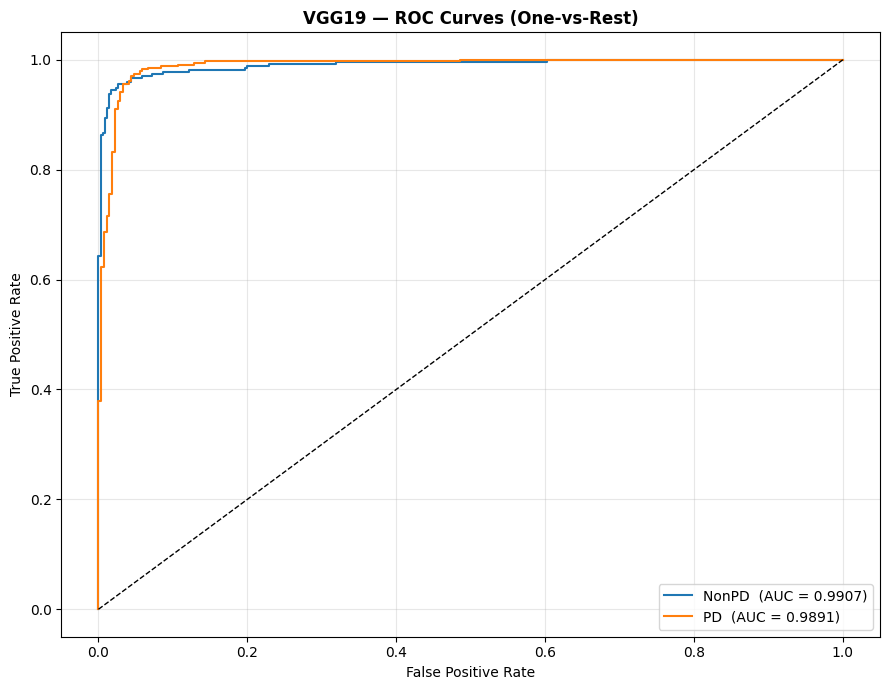

Mean AUC: 0.9899


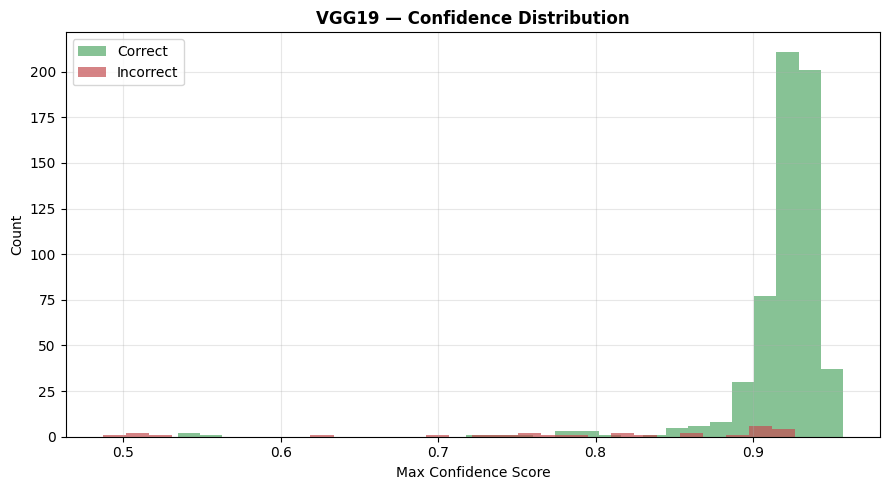

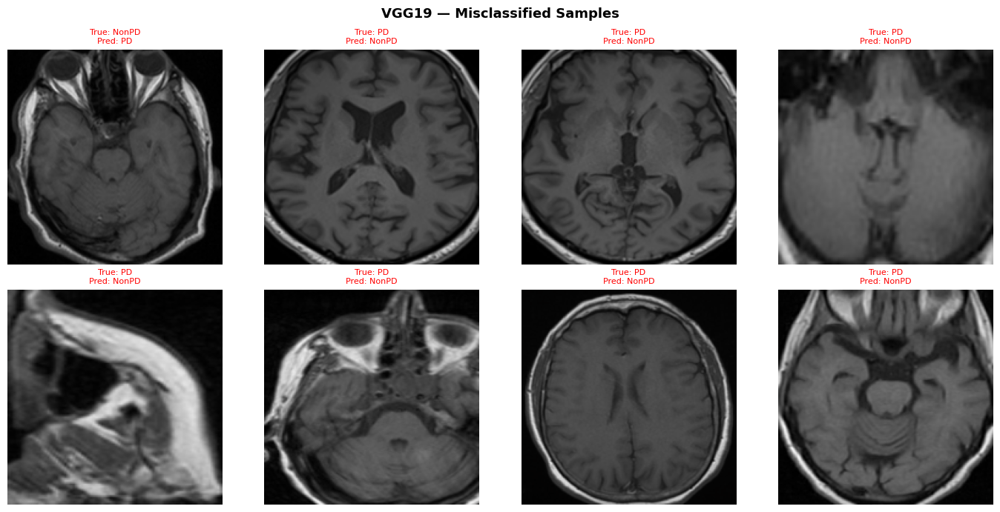

Total misclassified shown: 8


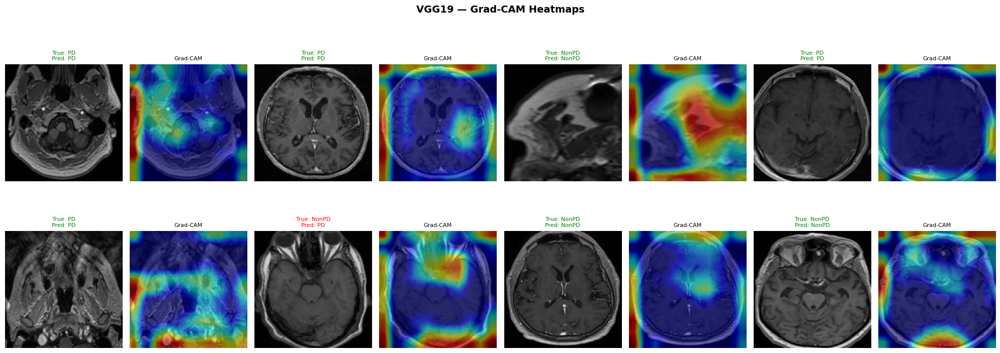

Grad-CAM complete for VGG19


In [19]:
CLASS_NAMES = ['NonPD', 'PD'] # Temporarily fix for this cell, as it was incorrectly populated globally
# ============================================================
# VGG19 — Evaluate + Grad-CAM
# ============================================================
vgg19.load_state_dict(torch.load(history_vgg19["save_path"], map_location=device))

eval_vgg19 = evaluate_model(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg19, MODEL_NAME)
plot_confusion_matrix(eval_vgg19, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg19, auc_scores_vgg19 = plot_roc_curves(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(vgg19, MODEL_NAME, vgg19.features[-3], test_loader, CLASS_NAMES)

In [20]:
save_model_result("VGG19", eval_vgg19, history_vgg19, mean_auc_vgg19)


Saved -> /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results/VGG19_result.json


---
## PHASE 9 — Model 3: DenseNet121

In [21]:
# ============================================================
# DenseNet121 — Build Model
# ============================================================
MODEL_NAME = "DenseNet121"

densenet = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)

# Freeze early, unfreeze denseblock3, denseblock4, norm5
for param in densenet.features.parameters():
    param.requires_grad = False
for param in densenet.features.denseblock3.parameters():
    param.requires_grad = True
for param in densenet.features.denseblock4.parameters():
    param.requires_grad = True
for param in densenet.features.norm5.parameters():
    param.requires_grad = True

densenet.classifier = nn.Sequential(
    nn.Linear(densenet.classifier.in_features, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.4),
    nn.Linear(512, NUM_CLASSES)
)

densenet = densenet.to(device)
trainable = sum(p.numel() for p in densenet.parameters() if p.requires_grad)
print(f"DenseNet121 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 127MB/s]


DenseNet121 trainable params: 5,524,227


In [22]:
# ============================================================
# DenseNet121 — Train
# ============================================================
criterion_densenet = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_densenet = optim.AdamW(
    filter(lambda p: p.requires_grad, densenet.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_densenet = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_densenet, T_max=EPOCHS, eta_min=1e-6
)

history_densenet = train_model(
    model=densenet, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_densenet, optimizer=optimizer_densenet,
    scheduler=scheduler_densenet, epochs=EPOCHS
)



 TRAINING: DenseNet121
Epoch [01/20]  Train Loss: 0.6301  Train Acc: 78.30%  Val Loss: 0.5073  Val Acc: 87.20%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.4352  Train Acc: 92.60%  Val Loss: 0.4044  Val Acc: 93.68%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3868  Train Acc: 95.52%  Val Loss: 0.3897  Val Acc: 94.98%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.3651  Train Acc: 96.74%  Val Loss: 0.3765  Val Acc: 94.65%
Epoch [05/20]  Train Loss: 0.3571  Train Acc: 96.98%  Val Loss: 0.3557  Val Acc: 96.60%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.3382  Train Acc: 98.02%  Val Loss: 0.4335  Val Acc: 93.52%
Epoch [07/20]  Train Loss: 0.3265  Train Acc: 98.82%  Val Loss: 0.3771  Val Acc: 95.30%
Epoch [08/20]  Train Loss: 0.3220  Train Acc: 98.78%  Val Loss: 0.3463  Val Acc: 97.24%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.3176  Train Acc: 99.10%  Val Loss: 0.3282  Val Acc: 97.73%  <- Best Saved (local + Drive


 TEST EVALUATION: DenseNet121

Test Accuracy : 96.92%

Classification Report:

              precision    recall  f1-score   support

       NonPD       0.96      0.97      0.97       272
          PD       0.98      0.97      0.97       345

    accuracy                           0.97       617
   macro avg       0.97      0.97      0.97       617
weighted avg       0.97      0.97      0.97       617



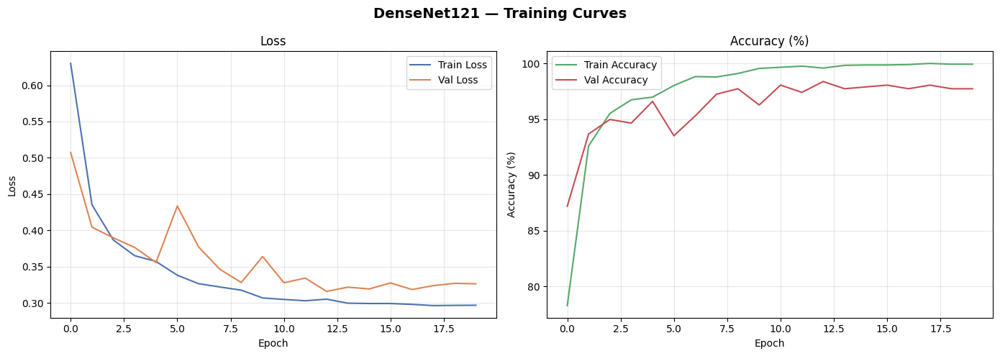

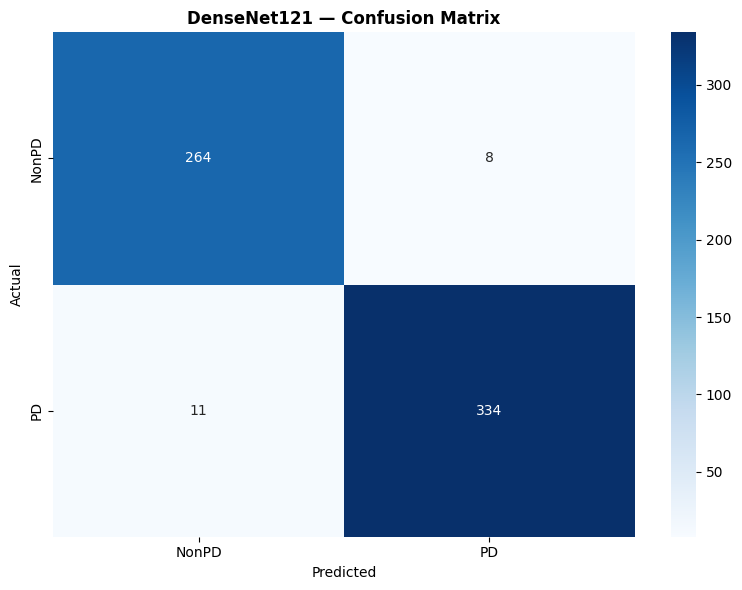

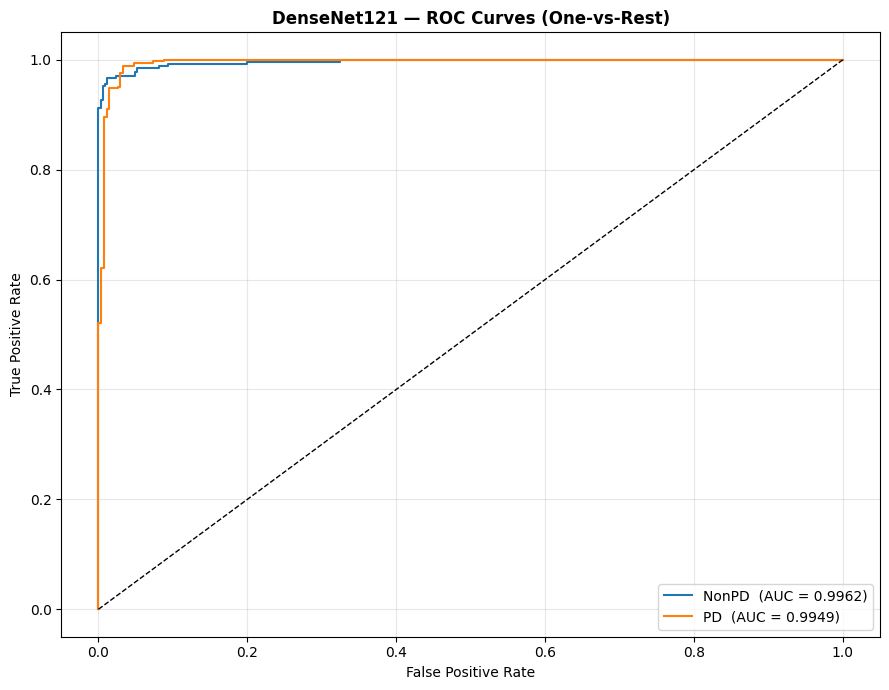

Mean AUC: 0.9956


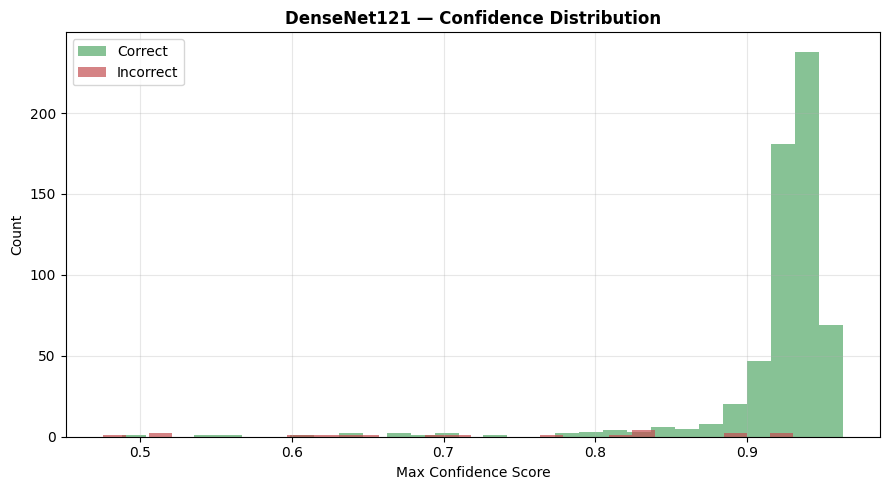

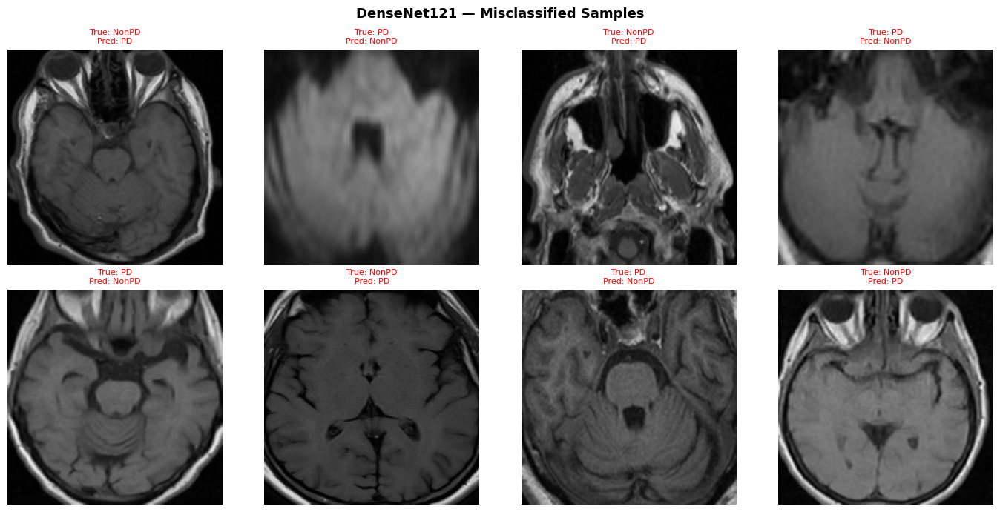

Total misclassified shown: 8


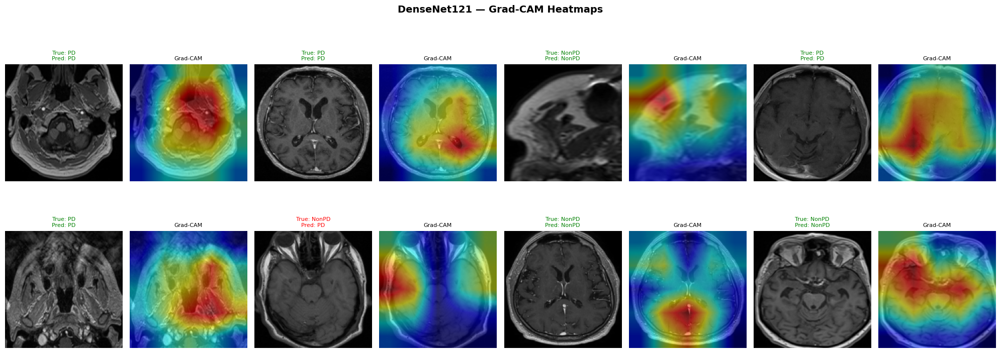

Grad-CAM complete for DenseNet121


In [23]:
# ============================================================
# DenseNet121 — Evaluate + Grad-CAM
# ============================================================
densenet.load_state_dict(torch.load(history_densenet["save_path"], map_location=device))

eval_densenet = evaluate_model(densenet, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_densenet, MODEL_NAME)
plot_confusion_matrix(eval_densenet, CLASS_NAMES, MODEL_NAME)
mean_auc_densenet, auc_scores_densenet = plot_roc_curves(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(densenet, test_loader, CLASS_NAMES, MODEL_NAME)

# Grad-CAM target: last dense block's norm layer acts as proxy
run_gradcam(densenet, MODEL_NAME, densenet.features.denseblock4, test_loader, CLASS_NAMES)

In [24]:
save_model_result("DenseNet121", eval_densenet, history_densenet, mean_auc_densenet)


Saved -> /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results/DenseNet121_result.json


---
## PHASE 10 — Model 4: InceptionV3

In [25]:
# ============================================================
# FIXED: InceptionV3 — Dedicated 299x299 DataLoaders
# Root cause: InceptionV3 needs >=299x299; 176x176 collapses
# spatial dims to 2x2 before a 5x5 conv → RuntimeError.
# Fix: build a separate loader that resizes to 299x299.
# ============================================================

INCEPTION_SIZE = 299

_inception_transform = T.Compose([
    T.Resize((INCEPTION_SIZE, INCEPTION_SIZE)),
    T.Normalize(mean=[0.0, 0.0, 0.0], std=[1.0, 1.0, 1.0])  # tensors already normalized
])

class InceptionTensorDataset(torch.utils.data.Dataset):
    """Re-sizes already-normalized tensors to 299x299 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [INCEPTION_SIZE, INCEPTION_SIZE],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

# Wrap existing split datasets
inc_train_data = InceptionTensorDataset(train_data)
inc_val_data   = InceptionTensorDataset(val_data)
inc_test_data  = InceptionTensorDataset(test_dataset)

def standard_collate(batch):
    imgs, labels, paths = zip(*batch)
    return torch.stack(imgs), torch.tensor(labels, dtype=torch.long), list(paths)

inc_train_loader = DataLoader(inc_train_data, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
inc_val_loader   = DataLoader(inc_val_data,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
inc_test_loader  = DataLoader(inc_test_data,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print(f"InceptionV3 loaders ready at {INCEPTION_SIZE}x{INCEPTION_SIZE}")
imgs, _, _ = next(iter(inc_train_loader))
print(f"Batch shape: {imgs.shape}")

InceptionV3 loaders ready at 299x299
Batch shape: torch.Size([32, 3, 299, 299])


In [26]:
# ============================================================
# FIXED: InceptionV3 — Build Model
# ============================================================
MODEL_NAME = "InceptionV3"

inception = models.inception_v3(
    weights=models.Inception_V3_Weights.IMAGENET1K_V1,
    aux_logits=True
)

# Freeze all; unfreeze Mixed_6e, Mixed_7a-c, fc, AuxLogits
for param in inception.parameters():
    param.requires_grad = False
for name, param in inception.named_parameters():
    if any(k in name for k in ["Mixed_6e", "Mixed_7a", "Mixed_7b", "Mixed_7c", "fc", "AuxLogits"]):
        param.requires_grad = True

# Replace main classifier head
inception.fc = nn.Sequential(
    nn.Linear(inception.fc.in_features, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

# Replace aux classifier head (required when aux_logits=True)
inception.AuxLogits.fc = nn.Linear(768, NUM_CLASSES)

inception = inception.to(device)
trainable = sum(p.numel() for p in inception.parameters() if p.requires_grad)
print(f"InceptionV3 trainable params: {trainable:,}")

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 168MB/s]


InceptionV3 trainable params: 18,572,294


In [27]:
# ============================================================
# FIXED: InceptionV3 — Train (uses 299x299 loaders)
# ============================================================
criterion_inception = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_inception = optim.AdamW(
    filter(lambda p: p.requires_grad, inception.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_inception = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_inception, T_max=EPOCHS, eta_min=1e-6
)

history_inception = train_model(
    model=inception, model_name=MODEL_NAME,
    train_loader=inc_train_loader,   # ← 299x299 loaders
    val_loader=inc_val_loader,
    criterion=criterion_inception, optimizer=optimizer_inception,
    scheduler=scheduler_inception, epochs=EPOCHS
)


 TRAINING: InceptionV3
Epoch [01/20]  Train Loss: 0.7674  Train Acc: 84.86%  Val Loss: 0.3911  Val Acc: 95.79%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.5245  Train Acc: 96.15%  Val Loss: 0.3546  Val Acc: 96.60%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.4667  Train Acc: 98.19%  Val Loss: 0.3276  Val Acc: 98.54%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.4446  Train Acc: 99.06%  Val Loss: 0.3404  Val Acc: 97.57%
Epoch [05/20]  Train Loss: 0.4374  Train Acc: 99.48%  Val Loss: 0.3296  Val Acc: 98.54%
Epoch [06/20]  Train Loss: 0.4304  Train Acc: 99.72%  Val Loss: 0.3297  Val Acc: 98.38%
Epoch [07/20]  Train Loss: 0.4255  Train Acc: 99.65%  Val Loss: 0.3093  Val Acc: 99.03%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.4194  Train Acc: 100.00%  Val Loss: 0.3088  Val Acc: 99.19%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.4188  Train Acc: 99.93%  Val Loss: 0.3135  Val Acc: 99.35%  <- Best Saved (local + Driv


 TEST EVALUATION: InceptionV3

Test Accuracy : 97.89%

Classification Report:

              precision    recall  f1-score   support

       NonPD       0.98      0.97      0.98       272
          PD       0.98      0.98      0.98       345

    accuracy                           0.98       617
   macro avg       0.98      0.98      0.98       617
weighted avg       0.98      0.98      0.98       617



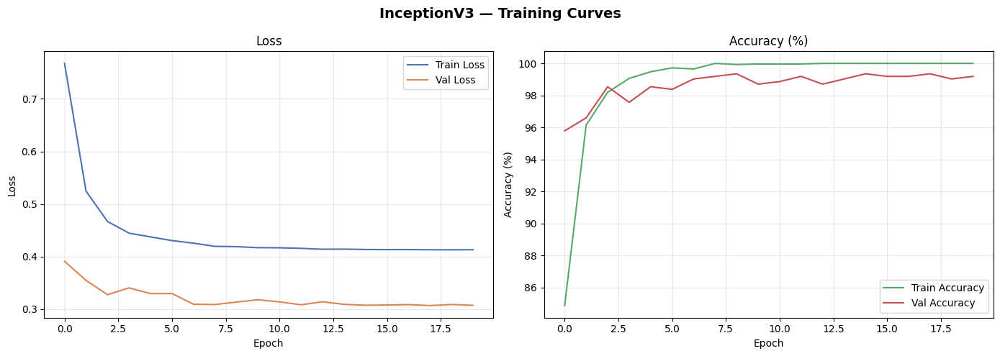

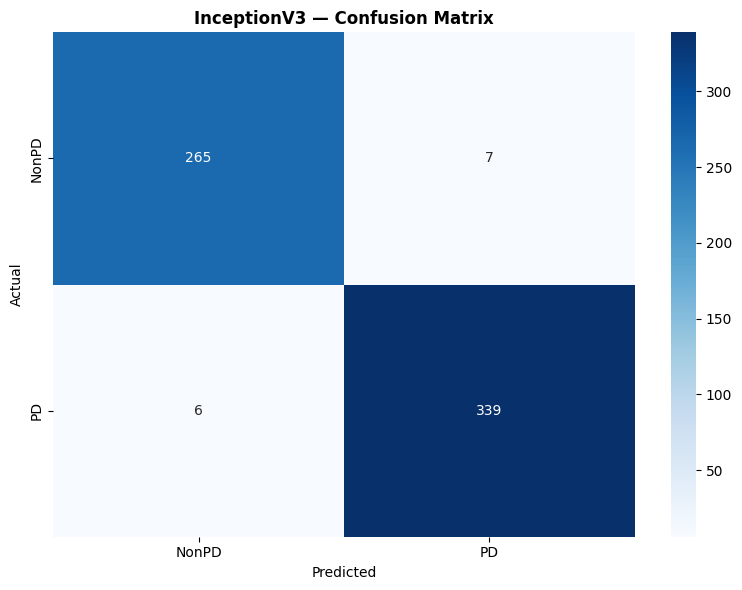

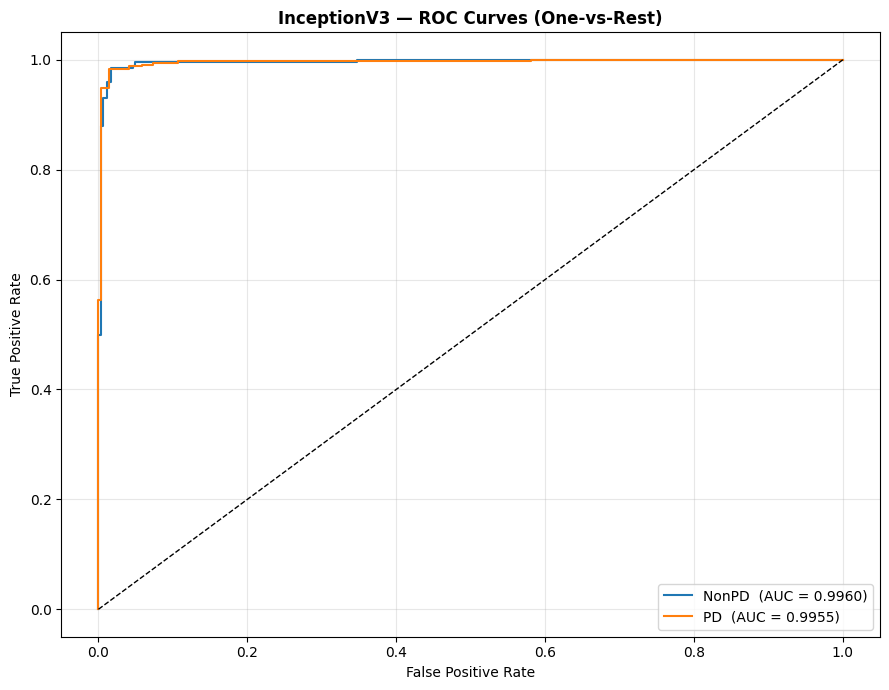

Mean AUC: 0.9957


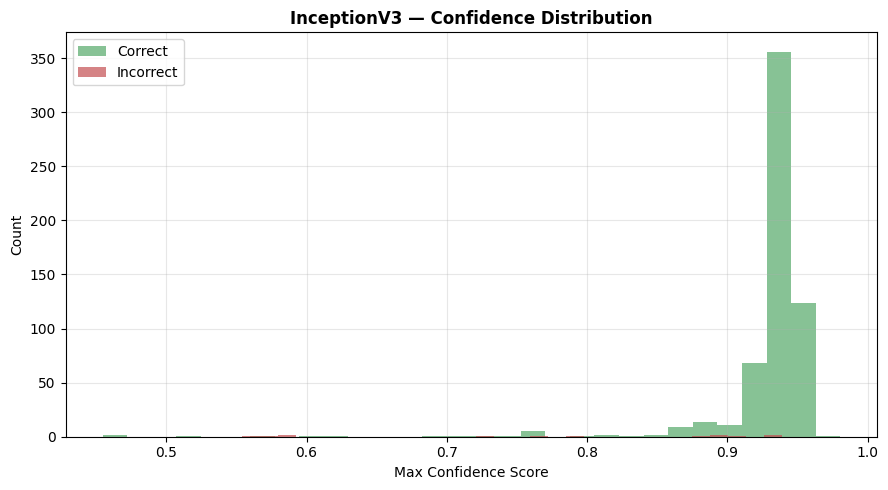

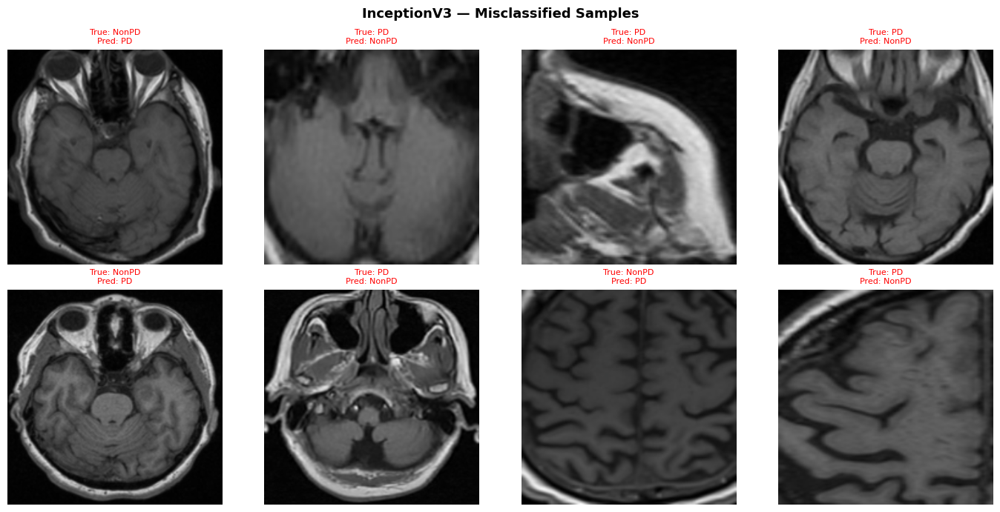

Total misclassified shown: 8


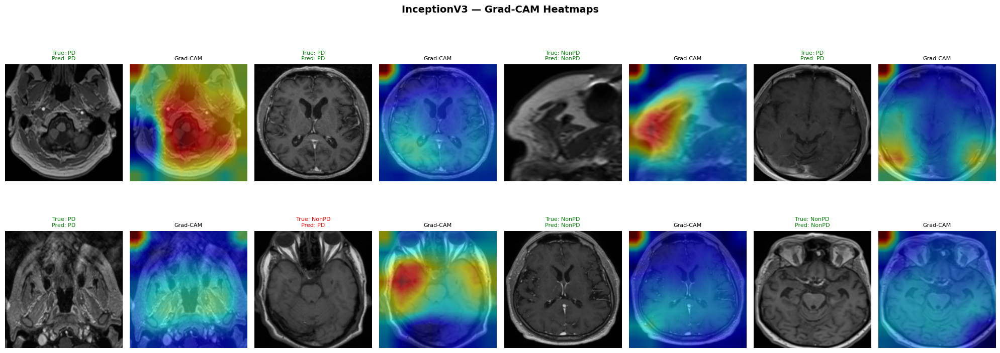

Grad-CAM complete for InceptionV3


In [28]:
# ============================================================
# FIXED: InceptionV3 — Evaluate + Grad-CAM (uses 299x299 test loader)
# ============================================================
inception.load_state_dict(torch.load(history_inception["save_path"], map_location=device))

eval_inception = evaluate_model(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_inception, MODEL_NAME)
plot_confusion_matrix(eval_inception, CLASS_NAMES, MODEL_NAME)
mean_auc_inception, auc_scores_inception = plot_roc_curves(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(inception, MODEL_NAME, inception.Mixed_7c, inc_test_loader, CLASS_NAMES)

In [29]:
save_model_result("InceptionV3", eval_inception, history_inception, mean_auc_inception)


Saved -> /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results/InceptionV3_result.json


---
## PHASE 11 — Model 5: ConvNeXt-Tiny

In [30]:
# ============================================================
# 224x224 DataLoaders — shared by ConvNeXt-Tiny, ViT, and Swin
# Root cause: these three architectures are pretrained on 224x224
# ImageNet crops (16x16 / 4x4 patch grids need to divide 224 evenly),
# while our base pipeline tensors are 176x176. Reusing the InceptionV3
# pattern: wrap the existing (already-normalized) tensors and resize
# them on the fly, instead of rebuilding the dataset from raw images.
# ============================================================

RESIZE_224 = 224

class Resized224Dataset(torch.utils.data.Dataset):
    """Resizes already-normalized tensors to 224x224 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [RESIZE_224, RESIZE_224],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

r224_train_data = Resized224Dataset(train_data)
r224_val_data   = Resized224Dataset(val_data)
r224_test_data  = Resized224Dataset(test_dataset)

train_loader_224 = DataLoader(r224_train_data, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
val_loader_224   = DataLoader(r224_val_data,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
test_loader_224  = DataLoader(r224_test_data,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print("224x224 loaders ready (shared by ConvNeXt-Tiny / ViT / Swin)")
imgs, _, _ = next(iter(train_loader_224))
print(f"Batch shape: {imgs.shape}")


224x224 loaders ready (shared by ConvNeXt-Tiny / ViT / Swin)
Batch shape: torch.Size([32, 3, 224, 224])


In [31]:
# ============================================================
# ConvNeXt-Tiny — Build Model
#
# Overfitting/underfitting considerations for this model:
#   - Backbone is frozen except the LAST stage (stages.3) + head, so
#     most of the ImageNet-pretrained feature hierarchy is preserved
#     (low risk of overfitting the ~10-12k image MRI set) while the
#     high-level features can still adapt to MRI-specific texture.
#   - drop_path_rate=0.1 adds stochastic depth regularization, which
#     ConvNeXt was designed to use during fine-tuning.
#   - Same AdamW + weight_decay + label_smoothing + batch augmentation
#     already used for the other CNN models applies here too.
# ============================================================
MODEL_NAME = "ConvNeXt_Tiny"

convnext = timm.create_model(
    "convnext_tiny",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_path_rate=0.1
)

for param in convnext.parameters():
    param.requires_grad = False
for name, param in convnext.named_parameters():
    if any(k in name for k in ["stages.3", "head", "norm_pre"]):
        param.requires_grad = True

convnext = convnext.to(device)
trainable = sum(p.numel() for p in convnext.parameters() if p.requires_grad)
print(f"ConvNeXt-Tiny trainable params: {trainable:,}")


model.safetensors: reconstructing file:   0%|          |  0.00B /  114MB            

model.safetensors: downloading bytes:           |  0.00B            

ConvNeXt-Tiny trainable params: 15,474,435


In [32]:
# ============================================================
# ConvNeXt-Tiny — Train
# ============================================================
criterion_convnext = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_convnext = optim.AdamW(
    filter(lambda p: p.requires_grad, convnext.parameters()),
    lr=2e-4, weight_decay=1e-4
)
scheduler_convnext = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_convnext, T_max=EPOCHS, eta_min=1e-6
)

history_convnext = train_model(
    model=convnext, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_convnext, optimizer=optimizer_convnext,
    scheduler=scheduler_convnext, epochs=EPOCHS
)



 TRAINING: ConvNeXt_Tiny
Epoch [01/20]  Train Loss: 0.7561  Train Acc: 72.50%  Val Loss: 0.7813  Val Acc: 63.53%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.4815  Train Acc: 89.03%  Val Loss: 0.3759  Val Acc: 95.30%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3856  Train Acc: 95.21%  Val Loss: 0.3461  Val Acc: 97.08%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.3605  Train Acc: 96.22%  Val Loss: 0.3517  Val Acc: 96.27%
Epoch [05/20]  Train Loss: 0.3381  Train Acc: 97.57%  Val Loss: 0.4005  Val Acc: 94.81%
Epoch [06/20]  Train Loss: 0.3356  Train Acc: 97.67%  Val Loss: 0.3179  Val Acc: 98.70%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.3220  Train Acc: 98.12%  Val Loss: 0.3193  Val Acc: 98.87%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.3111  Train Acc: 98.89%  Val Loss: 0.3192  Val Acc: 98.70%
Epoch [09/20]  Train Loss: 0.3069  Train Acc: 99.06%  Val Loss: 0.3332  Val Acc: 98.06%
Epoch [10/20]  Train Loss: 


 TEST EVALUATION: ConvNeXt_Tiny

Test Accuracy : 98.38%

Classification Report:

              precision    recall  f1-score   support

       NonPD       0.98      0.98      0.98       272
          PD       0.99      0.99      0.99       345

    accuracy                           0.98       617
   macro avg       0.98      0.98      0.98       617
weighted avg       0.98      0.98      0.98       617



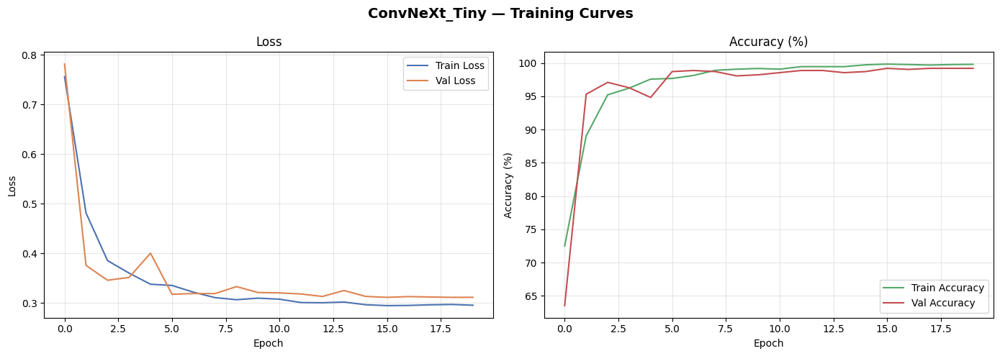

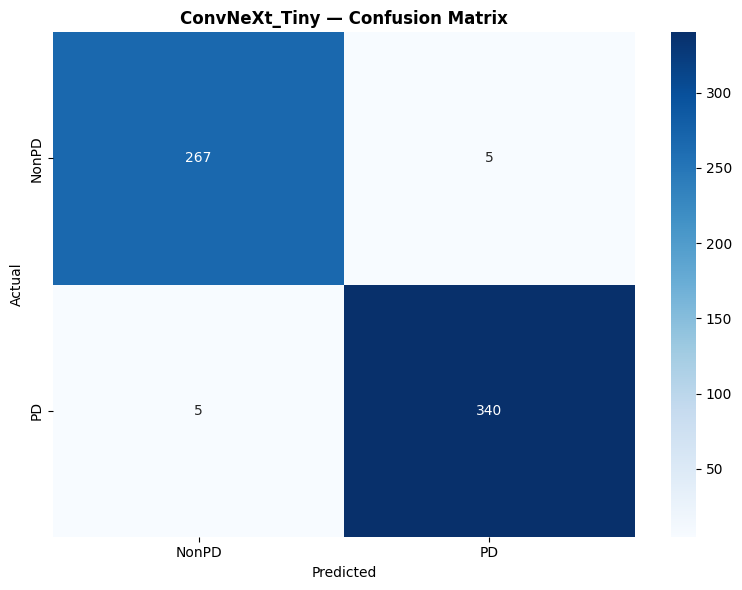

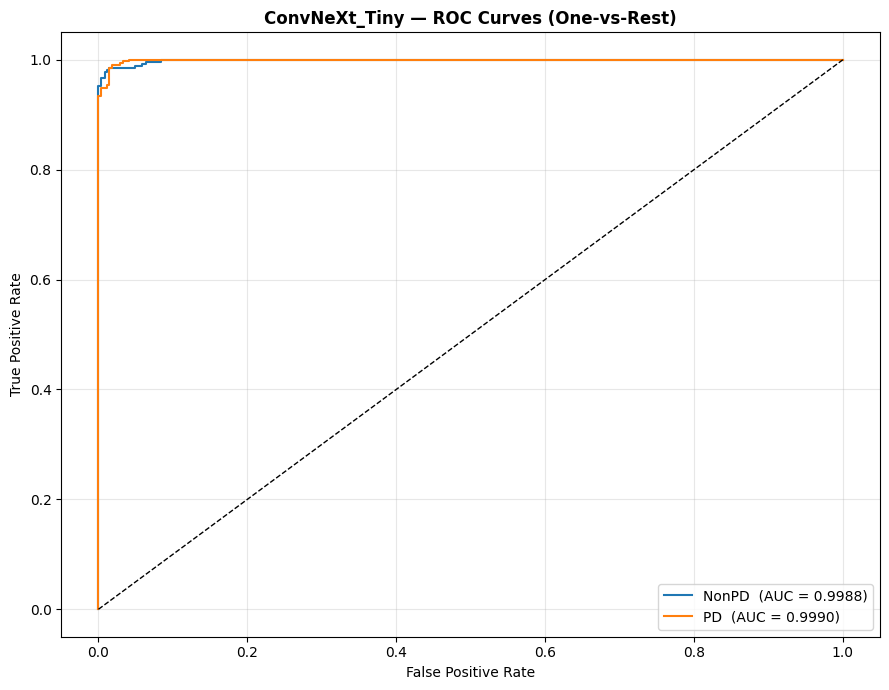

Mean AUC: 0.9989


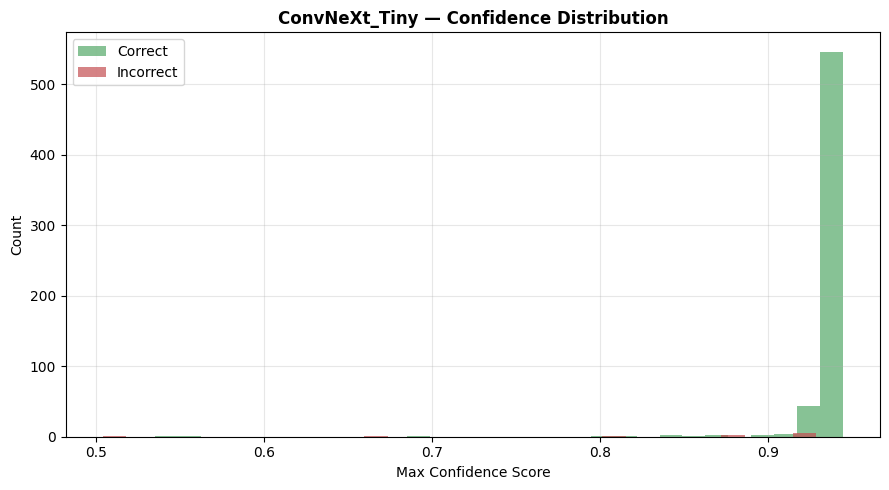

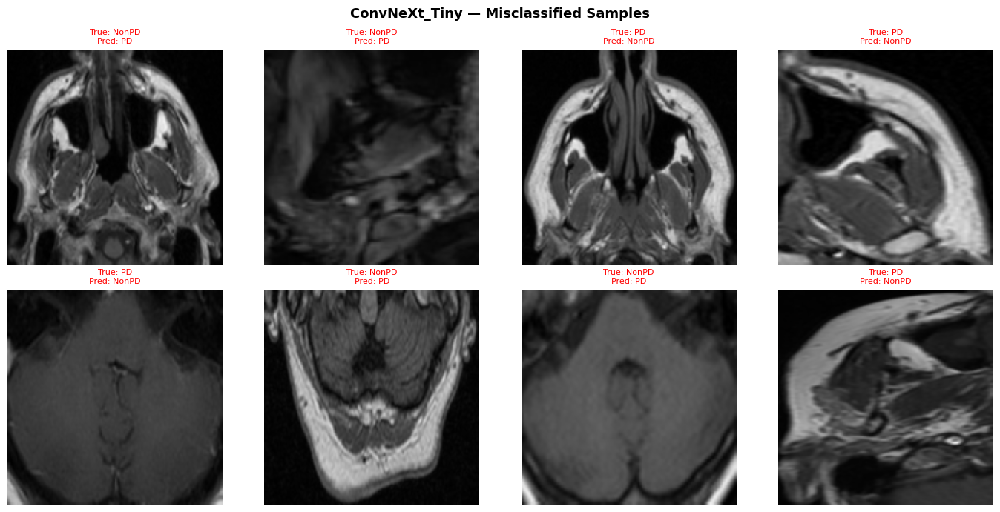

Total misclassified shown: 8


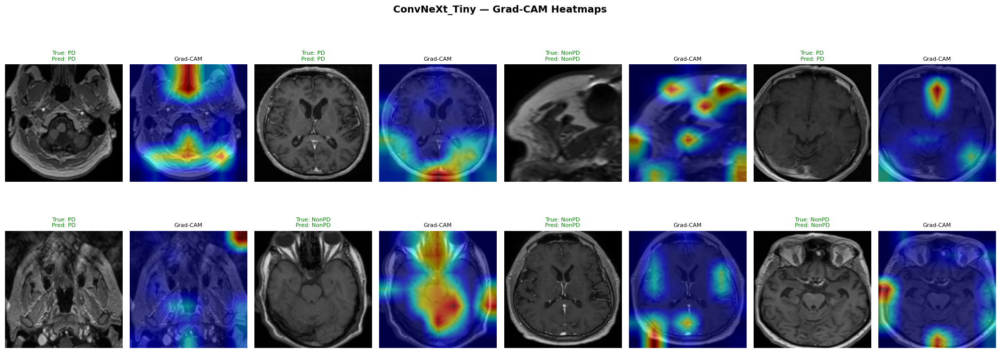

Grad-CAM complete for ConvNeXt_Tiny


In [33]:
# ============================================================
# ConvNeXt-Tiny — Evaluate + Grad-CAM
# ConvNeXt is a convolutional backbone (not tokens), so Grad-CAM works
# the same way as VGG/DenseNet — no reshape_transform needed.
# ============================================================
convnext.load_state_dict(torch.load(history_convnext["save_path"], map_location=device))

eval_convnext = evaluate_model(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_convnext, MODEL_NAME)
plot_confusion_matrix(eval_convnext, CLASS_NAMES, MODEL_NAME)
mean_auc_convnext, auc_scores_convnext = plot_roc_curves(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)

run_gradcam(convnext, MODEL_NAME, convnext.stages[-1], test_loader_224, CLASS_NAMES)


In [34]:
save_model_result("ConvNeXt-Tiny", eval_convnext, history_convnext, mean_auc_convnext)


Saved -> /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results/ConvNeXt_Tiny_result.json


---
## PHASE 12 — Model 6: Vision Transformer (ViT)

In [35]:
# ============================================================
# ViT-Small (patch16, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - vit_small (not vit_base) is used deliberately: fewer parameters
#     means lower overfitting risk on a dataset this size.
#   - Only the last 2 transformer blocks + final norm + head are
#     unfrozen. ViT attention weights are sensitive to fine-tuning;
#     unfreezing the whole network on ~10k images tends to overfit
#     or destabilize the pretrained attention patterns.
#   - drop_rate / attn_drop_rate add dropout inside the MLP and
#     attention blocks as extra regularization.
#   - Learning rate is much lower than the CNN models (5e-5 vs 3e-4):
#     ViTs fine-tune best with small LR — too high causes the
#     pretrained attention maps to collapse (underfitting/instability),
#     too low barely updates the head (underfitting).
# ============================================================
MODEL_NAME = "ViT_Small"

vit = timm.create_model(
    "vit_small_patch16_224",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_rate=0.2,
    attn_drop_rate=0.1
)

for param in vit.parameters():
    param.requires_grad = False
for name, param in vit.named_parameters():
    if any(k in name for k in ["blocks.10", "blocks.11", "norm", "head"]):
        param.requires_grad = True

vit = vit.to(device)
trainable = sum(p.numel() for p in vit.parameters() if p.requires_grad)
print(f"ViT-Small trainable params: {trainable:,}")


model.safetensors: reconstructing file:   0%|          |  0.00B / 88.2MB            

model.safetensors: downloading bytes:           |  0.00B            

ViT-Small trainable params: 3,566,211


In [36]:
# ============================================================
# ViT-Small — Train
# ============================================================
criterion_vit = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vit = optim.AdamW(
    filter(lambda p: p.requires_grad, vit.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_vit = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vit, T_max=EPOCHS, eta_min=1e-6
)

history_vit = train_model(
    model=vit, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_vit, optimizer=optimizer_vit,
    scheduler=scheduler_vit, epochs=EPOCHS
)



 TRAINING: ViT_Small
Epoch [01/20]  Train Loss: 0.7753  Train Acc: 66.46%  Val Loss: 0.6178  Val Acc: 80.88%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.5750  Train Acc: 81.67%  Val Loss: 0.5131  Val Acc: 87.20%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.4844  Train Acc: 89.65%  Val Loss: 0.4519  Val Acc: 91.57%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.4261  Train Acc: 93.85%  Val Loss: 0.4222  Val Acc: 92.71%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3981  Train Acc: 95.52%  Val Loss: 0.3961  Val Acc: 94.49%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.3687  Train Acc: 97.15%  Val Loss: 0.3978  Val Acc: 95.46%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.3519  Train Acc: 98.37%  Val Loss: 0.3782  Val Acc: 95.95%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.3398  Train Acc: 98.92%  Val Loss: 0.3680  Val Acc: 96.11%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss:


 TEST EVALUATION: ViT_Small

Test Accuracy : 95.62%

Classification Report:

              precision    recall  f1-score   support

       NonPD       0.95      0.95      0.95       272
          PD       0.96      0.96      0.96       345

    accuracy                           0.96       617
   macro avg       0.96      0.96      0.96       617
weighted avg       0.96      0.96      0.96       617



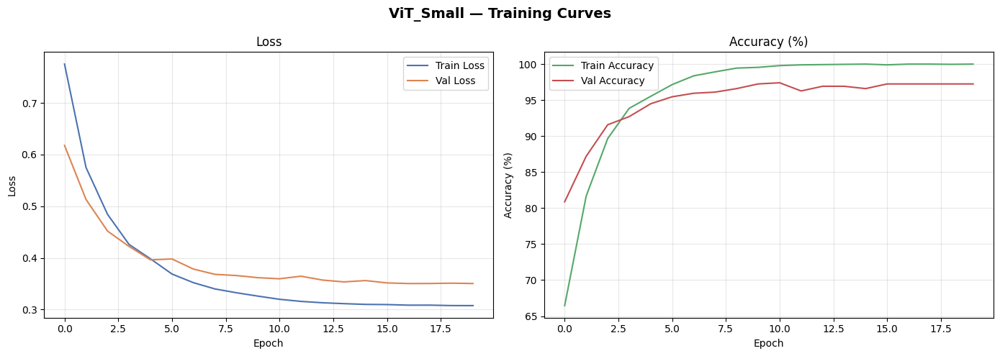

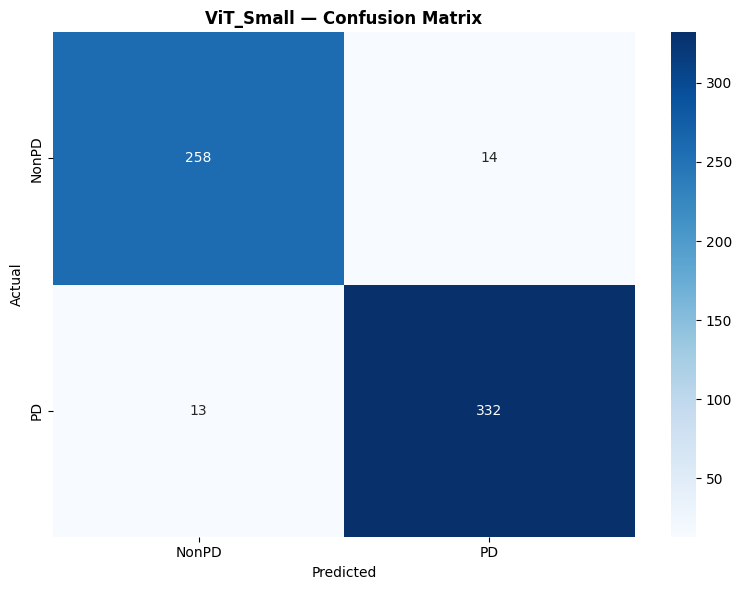

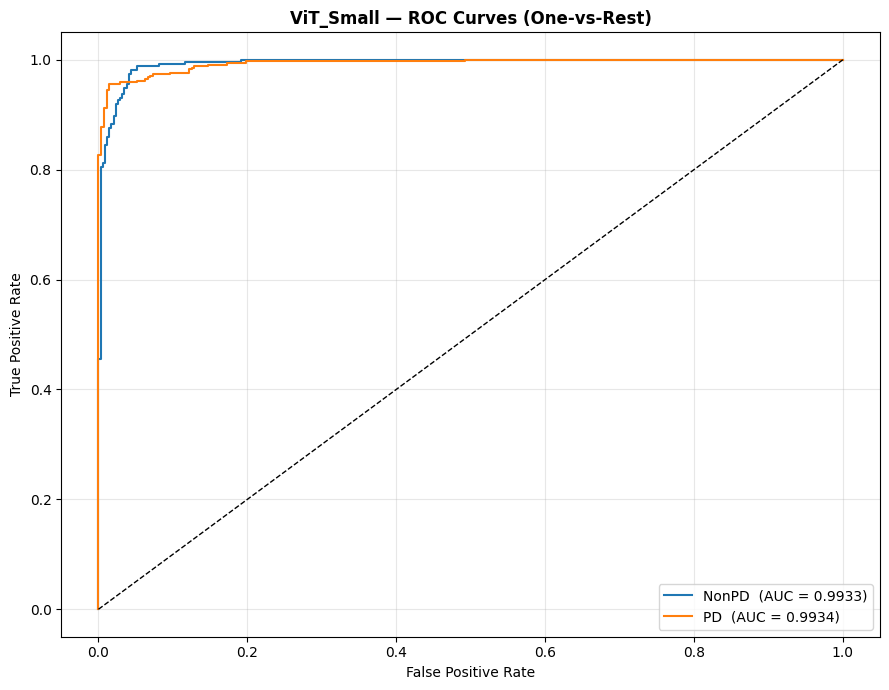

Mean AUC: 0.9933


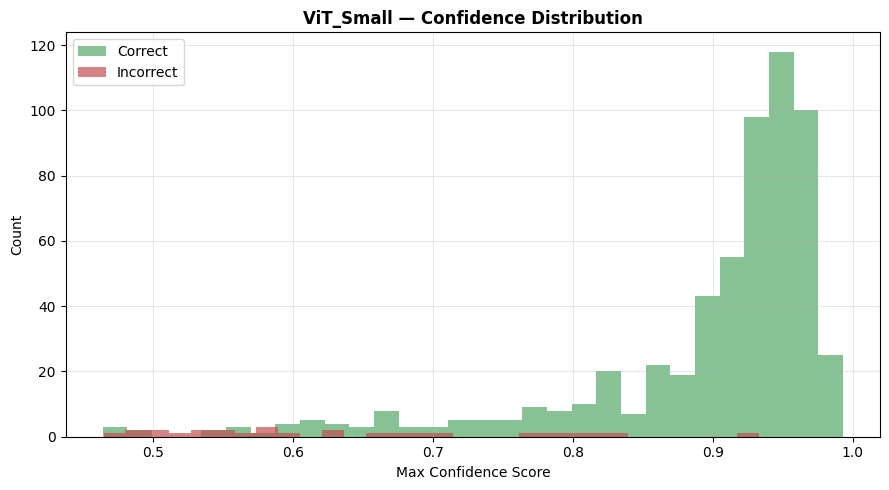

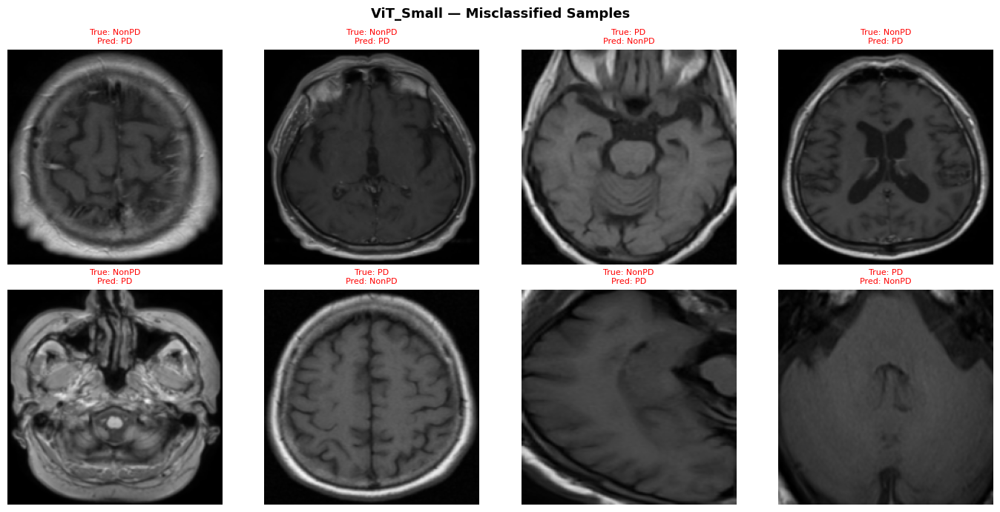

Total misclassified shown: 8


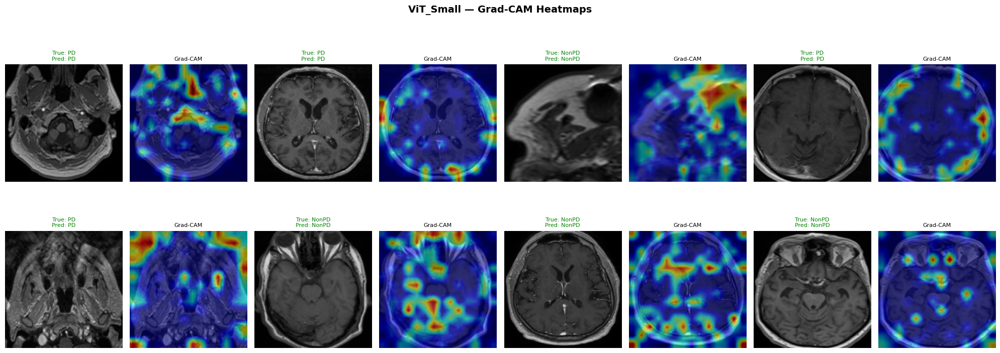

Grad-CAM complete for ViT_Small


In [37]:
# ============================================================
# ViT-Small — Evaluate + Grad-CAM
#
# ViT outputs a (batch, tokens, channels) sequence, not a spatial
# feature map, so standard Grad-CAM can't hook it directly. We use
# reshape_transform to drop the CLS token and fold the remaining
# 14x14=196 patch tokens back into a (batch, channels, 14, 14) map,
# targeting the last block's first LayerNorm (the standard choice
# recommended for ViT Grad-CAM).
# ============================================================
vit.load_state_dict(torch.load(history_vit["save_path"], map_location=device))

eval_vit = evaluate_model(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vit, MODEL_NAME)
plot_confusion_matrix(eval_vit, CLASS_NAMES, MODEL_NAME)
mean_auc_vit, auc_scores_vit = plot_roc_curves(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_vit(tensor, height=14, width=14):
    # drop CLS token (index 0), fold the rest into a spatial grid
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)  # -> (B, C, H, W)
    return result

run_gradcam(vit, MODEL_NAME, vit.blocks[-1].norm1, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_vit)


In [38]:
save_model_result("ViT-Small", eval_vit, history_vit, mean_auc_vit)


Saved -> /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results/ViT_Small_result.json


---
## PHASE 13 — Model 7: Swin Transformer

In [39]:
# ============================================================
# Swin-Tiny (patch4, window7, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - Only the last stage (layers.3) + final norm + head are unfrozen,
#     same reasoning as ConvNeXt/ViT above — Swin's windowed attention
#     in early stages encodes fairly generic local texture that
#     transfers well and doesn't need to be retrained.
#   - drop_rate + drop_path_rate regularize the MLP and stochastic
#     depth respectively.
#   - Low LR (5e-5), same rationale as ViT: Swin is also a transformer
#     and is sensitive to aggressive fine-tuning LRs.
# ============================================================
MODEL_NAME = "Swin_Tiny"

swin = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_rate=0.2,
    drop_path_rate=0.1
)

for param in swin.parameters():
    param.requires_grad = False
for name, param in swin.named_parameters():
    if any(k in name for k in ["layers.3", "norm", "head"]):
        param.requires_grad = True

swin = swin.to(device)
trainable = sum(p.numel() for p in swin.parameters() if p.requires_grad)
print(f"Swin-Tiny trainable params: {trainable:,}")


model.safetensors: reconstructing file:   0%|          |  0.00B /  114MB            

model.safetensors: downloading bytes:           |  0.00B            

Swin-Tiny trainable params: 15,384,435


In [ ]:
# ============================================================
# Swin-Tiny — Train
# ============================================================
criterion_swin = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_swin = optim.AdamW(
    filter(lambda p: p.requires_grad, swin.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_swin = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_swin, T_max=EPOCHS, eta_min=1e-6
)

history_swin = train_model(
    model=swin, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_swin, optimizer=optimizer_swin,
    scheduler=scheduler_swin, epochs=EPOCHS
)



 TRAINING: Swin_Tiny
Epoch [01/20]  Train Loss: 0.6504  Train Acc: 76.32%  Val Loss: 0.4683  Val Acc: 90.76%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.4527  Train Acc: 91.49%  Val Loss: 0.3918  Val Acc: 94.65%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3945  Train Acc: 95.38%  Val Loss: 0.3522  Val Acc: 97.57%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.3546  Train Acc: 97.47%  Val Loss: 0.3386  Val Acc: 98.70%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3411  Train Acc: 98.40%  Val Loss: 0.3388  Val Acc: 98.38%
Epoch [06/20]  Train Loss: 0.3283  Train Acc: 98.99%  Val Loss: 0.3233  Val Acc: 99.03%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.3167  Train Acc: 99.10%  Val Loss: 0.3156  Val Acc: 99.19%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.3175  Train Acc: 99.06%  Val Loss: 0.3161  Val Acc: 98.70%
Epoch [09/20]  Train Loss: 0.3102  Train Acc: 99.62%  Val Loss: 0.3181  Val Acc: 98.87%



 TEST EVALUATION: Swin_Tiny

Test Accuracy : 97.57%

Classification Report:

              precision    recall  f1-score   support

       NonPD       0.97      0.97      0.97       272
          PD       0.98      0.98      0.98       345

    accuracy                           0.98       617
   macro avg       0.98      0.98      0.98       617
weighted avg       0.98      0.98      0.98       617



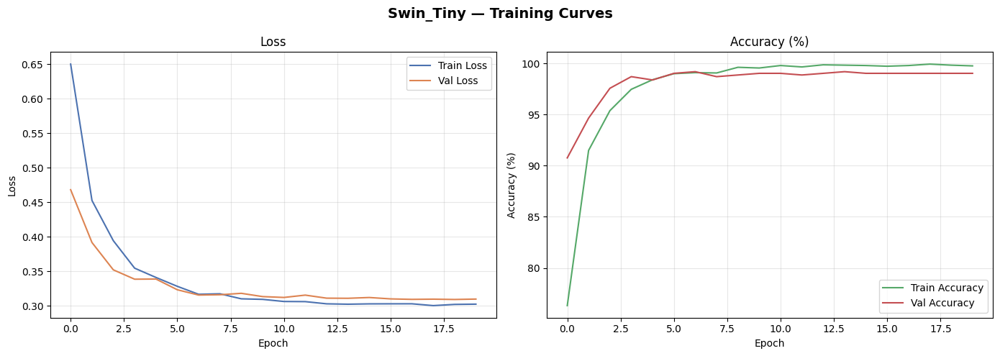

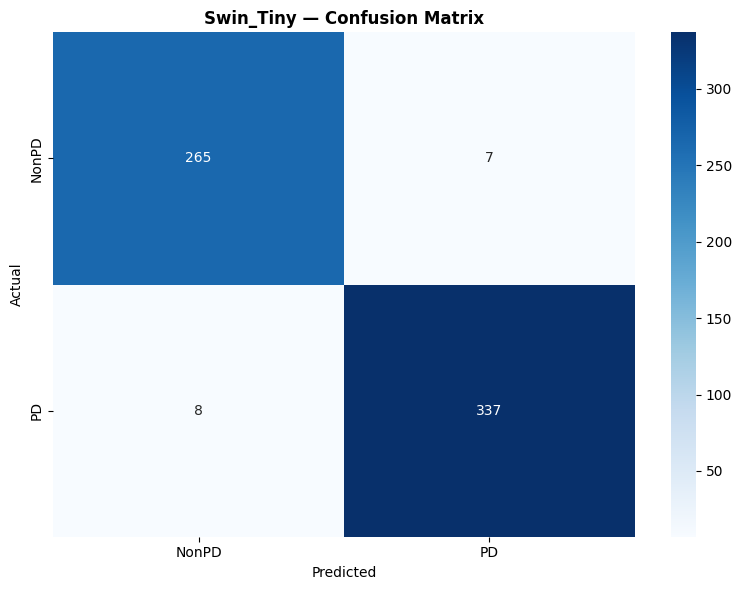

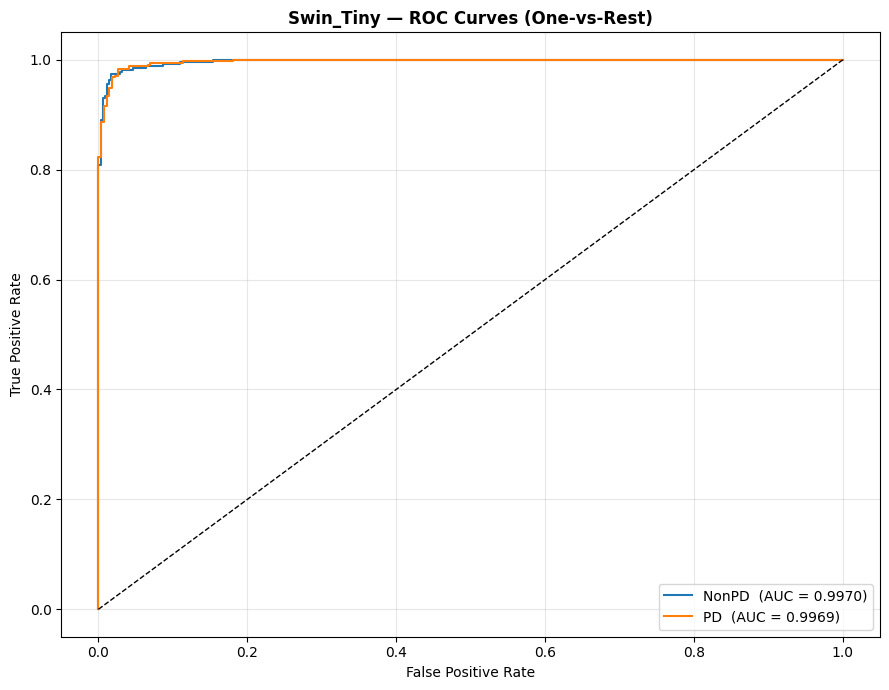

Mean AUC: 0.9970


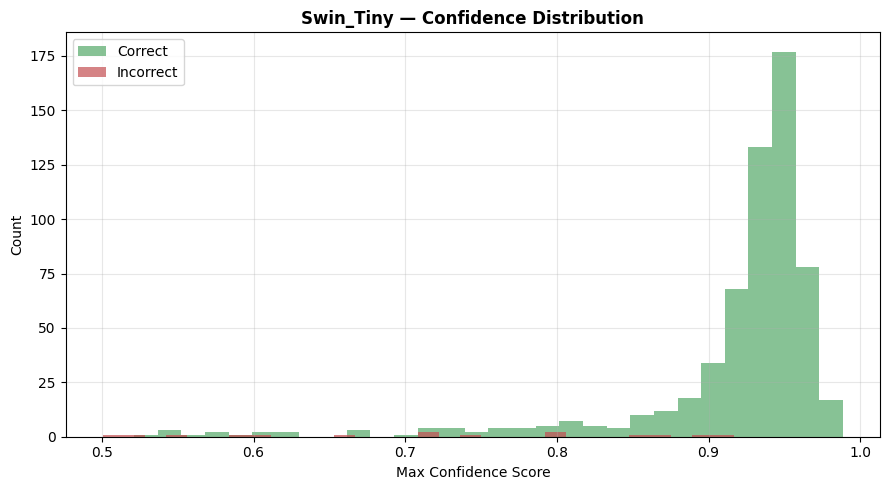

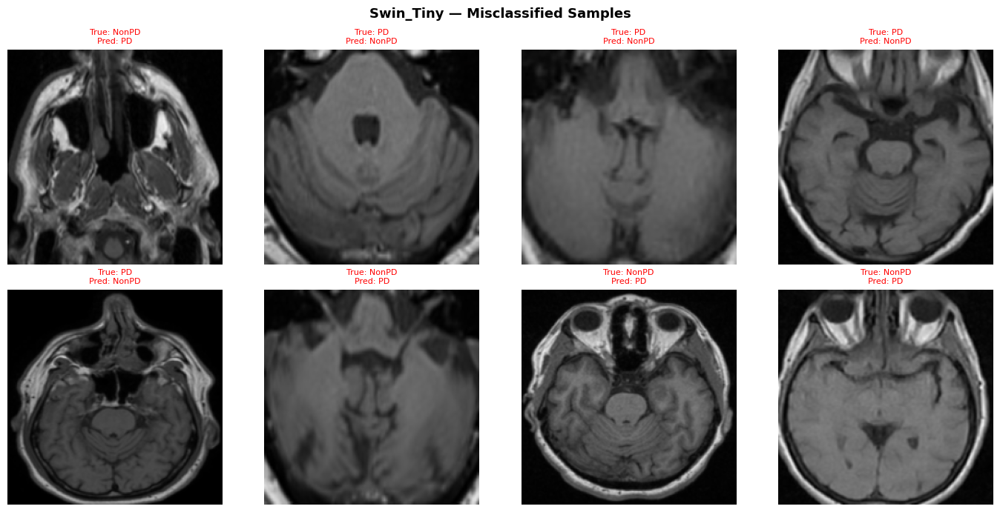

Total misclassified shown: 8


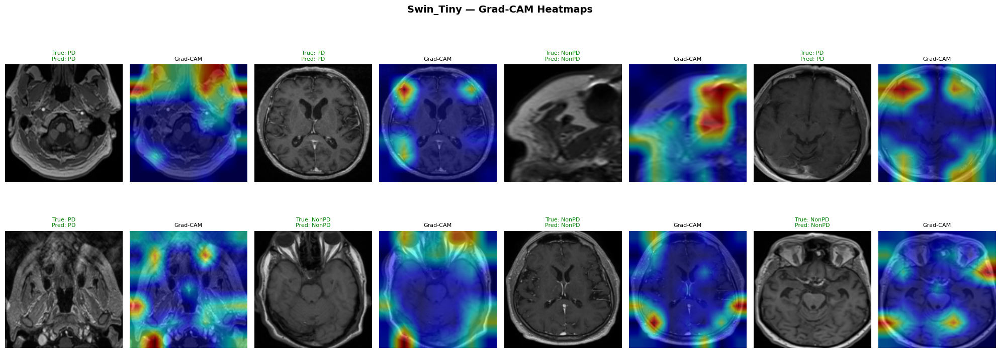

Grad-CAM complete for Swin_Tiny


In [ ]:
# ============================================================
# Swin-Tiny — Evaluate + Grad-CAM
#
# Like ViT, Swin's final stage outputs (batch, tokens, channels) with
# no CLS token this time — at 224 input with window7/patch4, the last
# stage resolution is 7x7=49 tokens. reshape_transform folds these
# back into a (batch, channels, 7, 7) map.
# ============================================================
swin.load_state_dict(torch.load(history_swin["save_path"], map_location=device))

eval_swin = evaluate_model(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_swin, MODEL_NAME)
plot_confusion_matrix(eval_swin, CLASS_NAMES, MODEL_NAME)
mean_auc_swin, auc_scores_swin = plot_roc_curves(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_swin(tensor, height=7, width=7):
    result = tensor.reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)  # -> (B, C, H, W)
    return result

run_gradcam(swin, MODEL_NAME, swin.layers[-1].blocks[-1].norm2, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_swin)


In [ ]:
save_model_result("Swin-Tiny", eval_swin, history_swin, mean_auc_swin)


Saved -> /content/drive/MyDrive/defence/project dataset/Parkinson/saved_models/results/Swin_Tiny_result.json


---
## PHASE 14 — Model Comparison Dashboard

In [ ]:
# ============================================================
# PHASE 14 — Model Comparison Dashboard (Drive-backed)
# Rebuilds the comparison from saved JSON results on Google Drive.
# Works in a brand-new runtime -- you do NOT need to have trained
# or evaluated any model in this session. Just mount Drive (Phase 2)
# and run this cell once results exist for the models you care about.
# ============================================================
df_comparison = load_all_model_results()
df_comparison["Rank"] = df_comparison["Test Accuracy (%)"].rank(ascending=False).astype(int)
df_comparison = df_comparison.sort_values("Test Accuracy (%)", ascending=False).reset_index(drop=True)

print("\n" + "="*80)
print(" MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)")
print(f" Models found: {len(df_comparison)} / 7")
if len(df_comparison) < 7:
    missing = {"VGG16","VGG19","DenseNet121","InceptionV3","ConvNeXt-Tiny","ViT-Small","Swin-Tiny"} - set(df_comparison["Model"])
    print(f" Still missing: {sorted(missing)}")
print("="*80)
print(df_comparison.to_string(index=False))
print("="*80)
print(f"\n  BEST MODEL   : {df_comparison.iloc[0]['Model']}")
print(f"  Test Accuracy: {df_comparison.iloc[0]['Test Accuracy (%)']:.2f}%")
print(f"  Mean AUC     : {df_comparison.iloc[0]['Mean AUC']:.4f}")
print(f"  Best Val Acc : {df_comparison.iloc[0]['Best Val Acc (%)']:.2f}%")
print("="*80)



 MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)
 Models found: 7 / 7
        Model  Test Accuracy (%)  Mean AUC  Training Time (min)  Best Val Acc (%)  Rank
ConvNeXt-Tiny          98.379254  0.998918             4.917561         99.189627     1
  InceptionV3          97.893031  0.995732             7.024154         99.351702     2
    Swin-Tiny          97.568882  0.996979             8.071569         99.189627     3
  DenseNet121          96.920583  0.995588             4.404593         98.379254     4
        VGG16          96.763754  0.991202             6.560224         96.920583     5
    ViT-Small          95.623987  0.993313             4.877353         97.406807     6
        VGG19          95.461912  0.989892             7.638915         97.244733     7

  BEST MODEL   : ConvNeXt-Tiny
  Test Accuracy: 98.38%
  Mean AUC     : 0.9989
  Best Val Acc : 99.19%


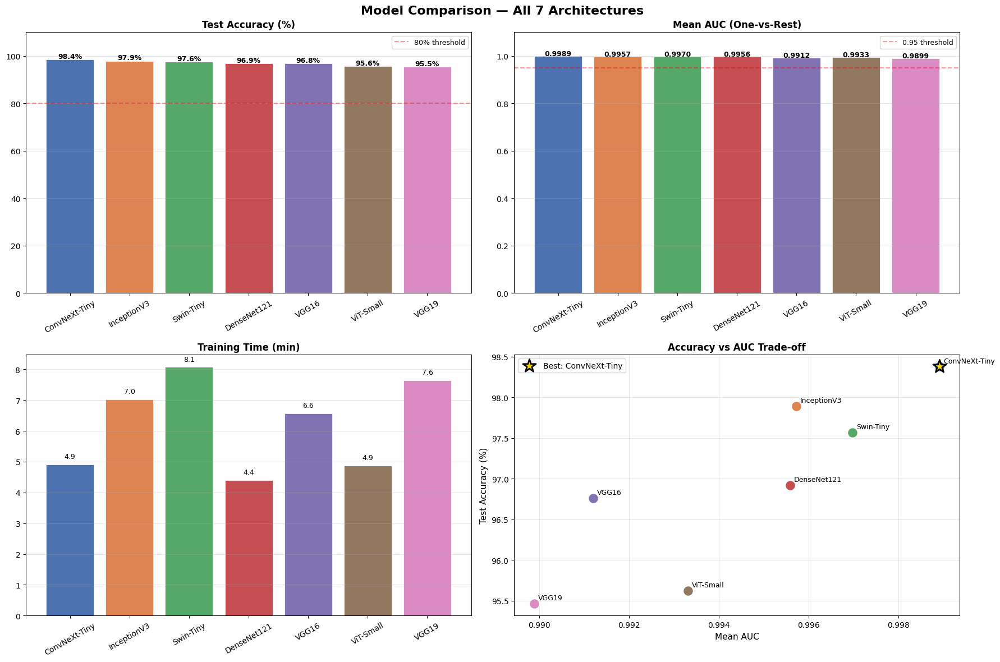


Comparison dashboard saved to /content/model_comparison_dashboard.png
Comparison dashboard + CSV saved to Google Drive.

BEST MODEL: ConvNeXt-Tiny
  Accuracy : 98.38%
  Mean AUC : 0.9989


In [ ]:
# ============================================================
# Comparison Visualization — 4-panel dashboard
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle("Model Comparison — All 7 Architectures", fontsize=16, fontweight='bold')

colors = ['#4C72B0','#DD8452','#55A868','#C44E52','#8172B2','#937860','#DA8BC3']
models_sorted = df_comparison["Model"].tolist()

# ── 1. Test Accuracy ──
ax = axes[0, 0]
bars = ax.bar(models_sorted, df_comparison["Test Accuracy (%)"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Test Accuracy (%)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 110)
ax.axhline(y=80, color='red', linestyle='--', alpha=0.4, label='80% threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Test Accuracy (%)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{val:.1f}%', ha='center', fontsize=9, fontweight='bold')

# ── 2. Mean AUC ──
ax = axes[0, 1]
bars = ax.bar(models_sorted, df_comparison["Mean AUC"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Mean AUC (One-vs-Rest)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 1.1)
ax.axhline(y=0.95, color='red', linestyle='--', alpha=0.4, label='0.95 threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Mean AUC"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f'{val:.4f}', ha='center', fontsize=9, fontweight='bold')

# ── 3. Training Time ──
ax = axes[1, 0]
bars = ax.bar(models_sorted, df_comparison["Training Time (min)"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Training Time (min)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
for bar, val in zip(bars, df_comparison["Training Time (min)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
            f'{val:.1f}', ha='center', fontsize=9)

# ── 4. Accuracy vs AUC scatter ──
ax = axes[1, 1]
for i, row in df_comparison.iterrows():
    ax.scatter(row["Mean AUC"], row["Test Accuracy (%)"],
               color=colors[i], s=180, zorder=5, edgecolors='white', linewidth=1.5)
    ax.annotate(row["Model"], (row["Mean AUC"], row["Test Accuracy (%)"]),
                textcoords="offset points", xytext=(5, 5), fontsize=9)
ax.set_xlabel("Mean AUC", fontsize=11)
ax.set_ylabel("Test Accuracy (%)", fontsize=11)
ax.set_title("Accuracy vs AUC Trade-off", fontweight='bold', fontsize=12)
ax.grid(alpha=0.3)
# Highlight best model
best = df_comparison.iloc[0]
ax.scatter(best["Mean AUC"], best["Test Accuracy (%)"],
           s=300, color='gold', zorder=6, edgecolors='black', linewidth=2,
           marker='*', label=f'Best: {best["Model"]}')
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig("/content/model_comparison_dashboard.png", dpi=150, bbox_inches='tight')
plt.show()
print("\nComparison dashboard saved to /content/model_comparison_dashboard.png")

# Also save to Drive
import shutil, os
drive_dir = "/content/drive/MyDrive/defence/project dataset/Parkinson/saved_models"
os.makedirs(drive_dir, exist_ok=True)
try:
    shutil.copy2("/content/model_comparison_dashboard.png",
                 f"{drive_dir}/model_comparison_dashboard.png")
    df_comparison.to_csv(f"{drive_dir}/model_comparison_results.csv", index=False)
    print("Comparison dashboard + CSV saved to Google Drive.")
except Exception as e:
    print(f"Drive save skipped: {e}")

print(f"\nBEST MODEL: {df_comparison.iloc[0]['Model']}")
print(f"  Accuracy : {df_comparison.iloc[0]['Test Accuracy (%)']:.2f}%")
print(f"  Mean AUC : {df_comparison.iloc[0]['Mean AUC']:.4f}")


In [ ]:
# ============================================================
# PHASE 15 — Download All Best Model Weights
# ============================================================
from google.colab import files

model_files = [
    "/content/VGG16_best.pth",
    "/content/VGG19_best.pth",
    "/content/DenseNet121_best.pth",
    "/content/InceptionV3_best.pth",
    "/content/ConvNeXt_Tiny_best.pth",
    "/content/ViT_Small_best.pth",
    "/content/Swin_Tiny_best.pth",
]

for f in model_files:
    if os.path.exists(f):
        print(f"Downloading {f} ...")
        files.download(f)
    else:
        print(f"NOT FOUND (not yet trained): {f}")

print("\nAll available model weights downloaded.")


---
## ✅ Pipeline Complete

**Outputs produced per model:**
- Confusion Matrix
- Classification Report (Precision / Recall / F1)
- Training & Validation Loss Curve
- Training & Validation Accuracy Curve
- ROC Curves (per class) + Mean AUC
- Confidence Distribution Plot
- Error Analysis (Misclassified Samples)
- Grad-CAM Heatmaps

**Final Phase 14:** All 7 models compared on Accuracy, AUC, and Training Time.